<img src="OC.png" width="50" height="50" align="left">    

***

<center> <font size="6"> <span style='color:Blue'> P5: Segmentez des clients d'un site e-commerce </span></font> </center>  

***

**Contexte**  
**Olist** est une entreprise brésilienne qui propose une solution de vente sue les marketplaces en ligne.
<img src="Olist.jpeg">
**Mission**   
Fournir à l'équipe marketing:  
* **une segmentation des clients** qu’elles pourront utiliser au quotidien pour leurs campagnes de communication.  
* **une description actionable** de la segmentation et de sa logique sous-jacente pour une utilisation optimale.
* **une proposition de contrat de maintenance** basée sur une analyse de la stabilité des segments au cours du temps.

 <font size="4"> <span style="font-size: 1.5em" > **Partie 1: Analyse exploratoire** </span> </font>  

Dans cette première partie, nous allons réaliser une analyse exploratoire après avoir nettoyé les données si besoin. Le but sera de déterminer les variables pertinentes ou d'en créer de nouvelles (feature engineering).

## Résumer 

**1. Analyse de la forme :**   
On dispose de **9** fichiers **.csv**
<img src="im_dataset.png">

* **olist_customers**: (99441, 5) base de données des informations sur les **96096 clients** et leur localisation. Elle peut-être utiliser pour identifier les clients uniques dans l'ensemble de données des commandes et pour trouver le lieu de livraison des commandes. Chaque commande est affectée à un identifiant client unique. Cela signifie qu'un même client obtiendra des identifiants différents pour différentes commandes. Le but d'avoir un customer_unique_id sur l'ensemble de données est de nous permettre d'identifier les clients qui ont effectué des rachats dans le magasin. 
    * **customer_id**: 99441 identifiants client par commande. (99441-96096=3345)? Il y a des clients qui ont effectué plusieurs commandes.  
    * **customer_unique_id**: 96096 identifiants uniques du client.
    * **customer_zip_code_prefix**: 14994 codes postals différents
    * **customer_city**: 4119 villes différentes
    * **customer_state**: 27 Etats différents
       
* **olist_geolocation**: (1000163, 5) base de données des informations sur les codes postaux brésiliens et ses coordonnées lat/lng. Elle peut-être utiliser pour trouver les distances entre les vendeurs et les clients.
    * **geolocation_zip_code_prefix**: 19015 codes postaux
    * **geolocation_lat**: latitude 
    * **geolocation_lng**: longitude
    * **geolocation_city**: 8011 Villes différentes
    * **geolocation_state**: 27 Etats différents  
    
* **olist_orders**: (99441, 8) base de données des commandes.   
    * **order_id**: 99441 identifiant unique de commande
    * **customer_id**: 99441 identifiant de client par commande
    * **order_status**: 8 états de la commande.: 'delivered' (livrée), 'invoiced'(facturée), 'shipped'(expédiée), 'processing'(en cours de traitement), 'unavailable'(non disponible),'canceled'(annulée), 'created'(crée), 'approved'(approuvée). 
    * **order_purchase_timestamp**: date de passage de la commande 
    * **order_approved_date**: date de validation de la commande
    * **order_delivered_carrier_date**: date d'envoie de la commande 
    * **order_delivered_customer_date**: date de livraison de la commande
    * **order_estimated_delivery_date**: date prévue de livraison de la commande
    
* **olist_order_items**: (112650, 7) base de données des articles achetés par commande:
    * **order_id**: identifiant unique de commande. 98666 id unique? =! 99441 ? 
    * **order_item_id**: numéro séquentiel identifiant le nombre d'articles inclus dans la même commande. Les lignes identiques sauf pour cette variable. ? 
    * **product_id**: identifiant unique de l'article. 32951 articles différents 
    * **seller_id**: identifiant unique du vendeur. 3095 vendeurs différents 
    * **shipping_limit_date**: date limite d'expédition du vendeur pour le traitement de la commande par le partenaire logistique.
    * **price**: prix de l'article
    * **freight_value**: frais de livraison (si une commande comporte plus d'un article, la valeur de frais est répartie entre les articles).
    
* **olist_order_payments**: (103886, 5) base de donnée du payement par commande.
    * **order_id**: identifiant commande: 99440 commandes différentes
    * **payment_sequential**: un client peut payer une commande avec plus d'un moyen de paiement. S'il le fait, une séquence sera créée pour accueillir tous les paiements.
    * **payment_type**: 5 types de payement.'credit_card'(carte de crédit), 'boleto'(billet), 'voucher'(bon d'achat), 'debit_card'(carte de débit), 'not_defined'(non défini)
    * **payment_installments**: nombre de versements choisi par le client.
    * **payment_value**: valeur de payement 
    
* **olist_order_reviews**: (99224, 7) base de données sur les avis rédigés par les clients. 
    * **review_id**: identifiant unique d'avis. 98410 valeurs uniques. =! 99224 ?  
    * **order_id**: identifiant unique de commande. 98673 valeurs uniques.
    * **review_score**: note allant de 1 à 5 donnée par le client sur une enquête de satisfaction.
    * **review_comment_title**: titre l'avis laissé par le client, en portugais.
    * **review_comment_message**: message de l'avis laissé par le client, en portugais.
    * **review_creation_date**:  date à laquelle l'enquête de satisfaction a été envoyée au client.
    * **review_answer_timestamp**: date de rédaction de l'avis par le client.
    
* **olist_products**: (32951, 9) base de données sur les produits vendus par Olist. 
    * **product_id**: identifiant unique du produit. 32951 valeurs uniques
    * **product_category_name**: catégorie du produit, en portugais. 73 valeurs uniques
    * **product_name_lenght**: nombre de caractères dans le nom du produit.
    * **product_description_lenght**: nombre de caractères dans la description du produit.
    * **product_photos_qty**: nombre de photos de produits publiées. 
    * **product_weight_g**: poids du produit mesuré en grammes.
    * **product_length_cm**: longueur du produit mesurée en centimètres.
    * **product_height_cm**: hauteur du produit mesurée en centimètres.
    * **product_width_cm**: largeur du produit mesurée en centimètres.
    
* **olist_product_category_name_translation**: (71, 2) base de données qui permet de traduir le product_category_name en anglais.
    * **product_category_name**: nom de catégorie en portugais. 71 valeurs uniques
    * **product_category_name_english**: nom de catégorie en englais. 71 valeurs uniques
    
* **olist_sellers**: (3095, 4) base de données sur les vendeurs qui ont exécuté les commandes passées chez Olist. Elle peut-être utiliser pour trouver l'emplacement du vendeur et pour identifier quel vendeur a fourni quel produit.
    * **seller_id**: identifiant unique de vendeur. 3095 valeurs uniques.
    * **seller_zip_code_prefix**: 5 premiers chiffres du code postal du vendeur. 2246 valeurs uniques.
    * **seller_city**: ville du vendeur. 611 valeurs uniques.
    * **seller_state**: Etat du vendeur. 23 valeurs uniques. 

**2. Analyse du fond :** 

* **Variables retenues pour la suite du projet:** 

## Importation des données et des librairies Python pour DS

In [1]:
%load_ext pycodestyle_magic
%flake8_on 

In [2]:
# ------------------------------------------
# projet : données des clients Olist
# Auteur : Rim BAHROUN
# Date: Janvier 2023
# OpenClassrooms
# -------------------------------------------
# importation des librairies Python pour DS
# -------------------------------------------
import numpy as np
import pandas as pd
import csv
import missingno as msno  # missing data visualizations
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import json
from urllib.request import urlopen
from datetime import timedelta

In [3]:
# pour afficher 165 colonnes ou lignes minimum
pd.set_option('display.max_column', 100)
pd.set_option('display.max_row', 100)

In [4]:
# importation des données
olist_customers = pd.read_csv('olist_customers_dataset.csv')

olist_geolocation = pd.read_csv('olist_geolocation_dataset.csv')

olist_orders = pd.read_csv('olist_orders_dataset.csv')
olist_order_items = pd.read_csv('olist_order_items_dataset.csv')
olist_order_payments = pd.read_csv('olist_order_payments_dataset.csv')
olist_order_reviews = pd.read_csv('olist_order_reviews_dataset.csv')

olist_products = pd.read_csv('olist_products_dataset.csv')
olist_product_category_name_translation = \
    pd.read_csv('product_category_name_translation.csv')

olist_sellers = pd.read_csv('olist_sellers_dataset.csv')

# Analyse de la forme

## olist_customers: (99441, 5)  
* Base de données des **96096** clients leurs localisations. Elle sert à identifier les clients uniques dans l'ensemble de données des commandes et pour trouver le lieu de livraison des commandes. Chaque commande est affectée à un identifiant client unique. Cela signifie qu'un même client obtiendra des identifiants différents pour différentes commandes. Le but d'avoir un customer_unique_id sur l'ensemble de données est de nous permettre d'identifier les clients qui ont effectué des rachats dans le magasin. 

    * **customer_id**: 99441 identifiants client par commande. (99441-96096=3345)? Il y a des clients qui ont effectué plusieurs commandes.  
    * **customer_unique_id**: 96096 identifiants uniques du client.
    * **customer_zip_code_prefix**: 14994 codes postals différents
    * **customer_city**: 4119 villes différentes
    * **customer_state**: 27 Etats différents

In [5]:
# base de données des clients
print("olist_customers: ", olist_customers.shape)
display(olist_customers.head(2))

olist_customers:  (99441, 5)


,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP


In [6]:
olist_customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB


In [7]:
olist_customers.describe(include=['O']).iloc[:2, :]

,customer_id,customer_unique_id,customer_city,customer_state
count,99441,99441,99441,99441
unique,99441,96096,4119,27


In [8]:
99441 - 96096

3345

Les 3345 correspondent à des clients qui ont passé plus d'une commande.

In [9]:
df_id = pd.DataFrame(olist_customers["customer_unique_id"].value_counts())
df_id.loc[df_id["customer_unique_id"] != 1]

,customer_unique_id
8d50f5eadf50201ccdcedfb9e2ac8455,17
3e43e6105506432c953e165fb2acf44c,9
1b6c7548a2a1f9037c1fd3ddfed95f33,7
ca77025e7201e3b30c44b472ff346268,7
6469f99c1f9dfae7733b25662e7f1782,7
...,...
370cd3b09ea745fe047fd11db7430441,2
d7c6bdf20c4ec9c9cda815dde58e778a,2
a366793a4999f8cc135855c4dd347421,2
156283b6ca35ef976a0265903145fd5e,2


In [10]:
olist_customers.loc[olist_customers["customer_unique_id"] ==
                    '8d50f5eadf50201ccdcedfb9e2ac8455', :]

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
14186,1bd3585471932167ab72a84955ebefea,8d50f5eadf50201ccdcedfb9e2ac8455,4045,sao paulo,SP
15321,a8fabc805e9a10a3c93ae5bff642b86b,8d50f5eadf50201ccdcedfb9e2ac8455,4045,sao paulo,SP
16654,897b7f72042714efaa64ac306ba0cafc,8d50f5eadf50201ccdcedfb9e2ac8455,4045,sao paulo,SP
36122,b2b13de0770e06de50080fea77c459e6,8d50f5eadf50201ccdcedfb9e2ac8455,4045,sao paulo,SP
38073,42dbc1ad9d560637c9c4c1533746f86d,8d50f5eadf50201ccdcedfb9e2ac8455,4045,sao paulo,SP
40141,dfb941d6f7b02f57a44c3b7c3fefb44b,8d50f5eadf50201ccdcedfb9e2ac8455,4045,sao paulo,SP
48614,65f9db9dd07a4e79b625effa4c868fcb,8d50f5eadf50201ccdcedfb9e2ac8455,4045,sao paulo,SP
52574,1c62b48fb34ee043310dcb233caabd2e,8d50f5eadf50201ccdcedfb9e2ac8455,4045,sao paulo,SP
58707,a682769c4bc10fc6ef2101337a6c83c9,8d50f5eadf50201ccdcedfb9e2ac8455,4045,sao paulo,SP
67996,6289b75219d757a56c0cce8d9e427900,8d50f5eadf50201ccdcedfb9e2ac8455,4045,sao paulo,SP


In [11]:
olist_customers["customer_zip_code_prefix"].apply(
    lambda x: str(x)).nunique()

14994

## olist_geolocation: (1000163, 5)

* Base de données des informations sur les codes postaux brésiliens et ses coordonnées lat/lng. Elle peut-être utiliser pour trouver les distances entre les vendeurs et les clients.
    * **geolocation_zip_code_prefix**: 19015 codes postaux
    * **geolocation_lat**: latitude 
    * **geolocation_lng**: longitude
    * **geolocation_city**: 8011 Villes différentes
    * **geolocation_state**: 27 Etats différents

In [12]:
print("olist_geolocation: ", olist_geolocation.shape)
display(olist_geolocation.head(2))

olist_geolocation:  (1000163, 5)


,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP


In [13]:
olist_geolocation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000163 entries, 0 to 1000162
Data columns (total 5 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   geolocation_zip_code_prefix  1000163 non-null  int64  
 1   geolocation_lat              1000163 non-null  float64
 2   geolocation_lng              1000163 non-null  float64
 3   geolocation_city             1000163 non-null  object 
 4   geolocation_state            1000163 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 38.2+ MB


In [14]:
olist_geolocation["geolocation_zip_code_prefix"].apply(
    lambda x: str(x)).nunique()

19015

In [15]:
olist_geolocation["geolocation_zip_code_prefix"].apply(
    lambda x: str(x)).unique()

array(['1037', '1046', '1041', ..., '99910', '99920', '99952'],
      dtype=object)

In [16]:
olist_geolocation.describe(include=['O']).iloc[:2, :]

,geolocation_city,geolocation_state
count,1000163,1000163
unique,8011,27


In [17]:
olist_geolocation.loc[
    olist_geolocation["geolocation_zip_code_prefix"] == 99910, :]

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
999786,99910,-27.863500,-52.084760,floriano peixoto,RS
999791,99910,-27.861309,-52.084405,floriano peixoto,RS
999810,99910,-27.861309,-52.084405,floriano peixoto,RS
999816,99910,-27.861309,-52.084405,floriano peixoto,RS
999829,99910,-27.859271,-52.085128,floriano peixoto,RS
999833,99910,-27.847065,-52.028621,floriano peixoto,RS


In [18]:
df = olist_geolocation.groupby(["geolocation_zip_code_prefix"])\
    .agg({"geolocation_lat": 'mean',
          "geolocation_lng": 'mean',
          "geolocation_city": pd.Series.mode,
          "geolocation_state": pd.Series.mode})
olist_geolocation_agg = df.reset_index()

In [19]:
olist_geolocation_agg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19015 entries, 0 to 19014
Data columns (total 5 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   geolocation_zip_code_prefix  19015 non-null  int64  
 1   geolocation_lat              19015 non-null  float64
 2   geolocation_lng              19015 non-null  float64
 3   geolocation_city             19015 non-null  object 
 4   geolocation_state            19015 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 742.9+ KB


## olist_orders: (99441, 8)

* Base de données des commandes: 
    * **order_id**: 99441 identifiant unique de commande
    * **customer_id**: 99441 identifiant de client par commande
    * **order_status**: 8 états de la commande.: 'delivered' (livrée), 'invoiced'(facturée), 'shipped'(expédiée), 'processing'(en cours de traitement), 'unavailable'(non disponible),'canceled'(annulée), 'created'(crée), 'approved'(approuvée). 
    * **order_purchase_timestamp**: date de passage de la commande 
    * **order_approved_at**: date de validation de la commande
    * **order_delivered_carrier_date**: date d'envoie de la commande 
    * **order_delivered_customer_date**: date de livraison de la commande
    * **order_estimated_delivery_date**: date prévue de livraison de la commande

In [20]:
print("olist_orders: ", olist_orders.shape)
display(olist_orders.head(2))

olist_orders:  (99441, 8)


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00


In [21]:
olist_orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.1+ MB


In [22]:
olist_orders.describe().iloc[:2, :]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
count,99441,99441,99441,99441,99281,97658,96476,99441
unique,99441,99441,8,98875,90733,81018,95664,459


In [23]:
olist_orders["order_status"].unique()

array(['delivered', 'invoiced', 'shipped', 'processing', 'unavailable',
       'canceled', 'created', 'approved'], dtype=object)

In [24]:
olist_orders["order_status"].value_counts()

delivered      96478
shipped         1107
canceled         625
unavailable      609
invoiced         314
processing       301
created            5
approved           2
Name: order_status, dtype: int64

In [25]:
col_date = olist_orders.columns[-5:]
col_date

Index(['order_purchase_timestamp', 'order_approved_at',
       'order_delivered_carrier_date', 'order_delivered_customer_date',
       'order_estimated_delivery_date'],
      dtype='object')

In [26]:
olist_orders[col_date] = olist_orders[col_date].apply(pd.to_datetime)

In [27]:
olist_orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       99441 non-null  object        
 1   customer_id                    99441 non-null  object        
 2   order_status                   99441 non-null  object        
 3   order_purchase_timestamp       99441 non-null  datetime64[ns]
 4   order_approved_at              99281 non-null  datetime64[ns]
 5   order_delivered_carrier_date   97658 non-null  datetime64[ns]
 6   order_delivered_customer_date  96476 non-null  datetime64[ns]
 7   order_estimated_delivery_date  99441 non-null  datetime64[ns]
dtypes: datetime64[ns](5), object(3)
memory usage: 6.1+ MB


In [28]:
olist_orders.head(2)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13


## olist_order_items: (112650, 7)

* Base de données des articles achetés par commande:
    * **order_id**: identifiant unique de commande. 98666 id unique? =! 99441 ? 
    * **order_item_id**: numéro séquentiel identifiant le nombre d'articles inclus dans la même commande. Les lignes identiques sauf pour cette variable. ? 
    * **product_id**: identifiant unique de l'article. 32951 articles différents 
    * **seller_id**: identifiant unique du vendeur. 3095 vendeurs différents 
    * **shipping_limit_date**: date limite d'expédition du vendeur pour le traitement de la commande par le partenaire logistique.
    * **price**: prix de l'article
    * **freight_value**: frais de livraison (si une commande comporte plus d'un article, la valeur de frais est répartie entre les articles).

In [29]:
print("olist_order_items: ", olist_order_items.shape)
display(olist_order_items.head(2))

olist_order_items:  (112650, 7)


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.9,19.93


In [30]:
olist_order_items.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


In [31]:
olist_order_items.describe(include=['O']).iloc[:2, :]

,order_id,product_id,seller_id,shipping_limit_date
count,112650,112650,112650,112650
unique,98666,32951,3095,93318


In [32]:
olist_order_items["order_item_id"].apply(
    lambda x: str(x)).value_counts()

1     98666
2      9803
3      2287
4       965
5       460
6       256
7        58
8        36
9        28
10       25
11       17
12       13
13        8
14        7
15        5
16        3
17        3
18        3
19        3
20        3
21        1
Name: order_item_id, dtype: int64

In [33]:
olist_order_items.loc[olist_order_items["order_item_id"] > 18, :]

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
11950,1b15974a0141d54e36626dca3fdc731a,19,ee3d532c8a438679776d222e997606b3,8e6d7754bc7e0f22c96d255ebda59eba,2018-03-01 02:50:48,100.0,10.12
11951,1b15974a0141d54e36626dca3fdc731a,20,ee3d532c8a438679776d222e997606b3,8e6d7754bc7e0f22c96d255ebda59eba,2018-03-01 02:50:48,100.0,10.12
57315,8272b63d03f5f79c56e9e4120aec44ef,19,270516a3f41dc035aa87d220228f844c,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57316,8272b63d03f5f79c56e9e4120aec44ef,20,270516a3f41dc035aa87d220228f844c,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57317,8272b63d03f5f79c56e9e4120aec44ef,21,79ce45dbc2ea29b22b5a261bbb7b7ee7,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,7.8,6.57
75121,ab14fdcfbe524636d65ee38360e22ce8,19,9571759451b1d780ee7c15012ea109d4,ce27a3cc3c8cc1ea79d11e561e9bebb6,2017-08-30 14:30:23,98.7,14.44
75122,ab14fdcfbe524636d65ee38360e22ce8,20,9571759451b1d780ee7c15012ea109d4,ce27a3cc3c8cc1ea79d11e561e9bebb6,2017-08-30 14:30:23,98.7,14.44


In [34]:
olist_order_items.loc[
    olist_order_items["product_id"] == "9571759451b1d780ee7c15012ea109d4", :]

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
75103,ab14fdcfbe524636d65ee38360e22ce8,1,9571759451b1d780ee7c15012ea109d4,ce27a3cc3c8cc1ea79d11e561e9bebb6,2017-08-30 14:30:23,98.7,14.44
75104,ab14fdcfbe524636d65ee38360e22ce8,2,9571759451b1d780ee7c15012ea109d4,ce27a3cc3c8cc1ea79d11e561e9bebb6,2017-08-30 14:30:23,98.7,14.44
75105,ab14fdcfbe524636d65ee38360e22ce8,3,9571759451b1d780ee7c15012ea109d4,ce27a3cc3c8cc1ea79d11e561e9bebb6,2017-08-30 14:30:23,98.7,14.44
75106,ab14fdcfbe524636d65ee38360e22ce8,4,9571759451b1d780ee7c15012ea109d4,ce27a3cc3c8cc1ea79d11e561e9bebb6,2017-08-30 14:30:23,98.7,14.44
75107,ab14fdcfbe524636d65ee38360e22ce8,5,9571759451b1d780ee7c15012ea109d4,ce27a3cc3c8cc1ea79d11e561e9bebb6,2017-08-30 14:30:23,98.7,14.44
75108,ab14fdcfbe524636d65ee38360e22ce8,6,9571759451b1d780ee7c15012ea109d4,ce27a3cc3c8cc1ea79d11e561e9bebb6,2017-08-30 14:30:23,98.7,14.44
75109,ab14fdcfbe524636d65ee38360e22ce8,7,9571759451b1d780ee7c15012ea109d4,ce27a3cc3c8cc1ea79d11e561e9bebb6,2017-08-30 14:30:23,98.7,14.44
75110,ab14fdcfbe524636d65ee38360e22ce8,8,9571759451b1d780ee7c15012ea109d4,ce27a3cc3c8cc1ea79d11e561e9bebb6,2017-08-30 14:30:23,98.7,14.44
75111,ab14fdcfbe524636d65ee38360e22ce8,9,9571759451b1d780ee7c15012ea109d4,ce27a3cc3c8cc1ea79d11e561e9bebb6,2017-08-30 14:30:23,98.7,14.44
75112,ab14fdcfbe524636d65ee38360e22ce8,10,9571759451b1d780ee7c15012ea109d4,ce27a3cc3c8cc1ea79d11e561e9bebb6,2017-08-30 14:30:23,98.7,14.44


Un client qui a acheté le même article dans la même commande pour une quantité de 20. 

In [35]:
# olist_order_items.loc[
#     olist_order_items["product_id"] == "270516a3f41dc035aa87d220228f844c", :]

In [36]:
olist_order_items.loc[
    olist_order_items["order_id"] == "8272b63d03f5f79c56e9e4120aec44ef", :]
# "1b15974a0141d54e36626dca3fdc731a"

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
57297,8272b63d03f5f79c56e9e4120aec44ef,1,270516a3f41dc035aa87d220228f844c,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57298,8272b63d03f5f79c56e9e4120aec44ef,2,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57299,8272b63d03f5f79c56e9e4120aec44ef,3,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57300,8272b63d03f5f79c56e9e4120aec44ef,4,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57301,8272b63d03f5f79c56e9e4120aec44ef,5,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57302,8272b63d03f5f79c56e9e4120aec44ef,6,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57303,8272b63d03f5f79c56e9e4120aec44ef,7,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57304,8272b63d03f5f79c56e9e4120aec44ef,8,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57305,8272b63d03f5f79c56e9e4120aec44ef,9,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57306,8272b63d03f5f79c56e9e4120aec44ef,10,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89


In [37]:
olist_order_items.groupby(["order_id"])["product_id"].value_counts().unique()

array([ 1,  2,  3,  4,  5,  6,  8, 20, 12, 13,  7, 15, 11, 14, 10,  9],
      dtype=int64)

In [38]:
olist_order_items.groupby(["order_id"])["seller_id"].value_counts().unique()

array([ 1,  2,  3,  4,  5,  6,  8, 20,  7, 12, 13, 15,  9, 11, 14, 21, 10],
      dtype=int64)

In [39]:
olist_order_items.head(2)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.9,19.93


In [40]:
# df = olist_order_items.groupby(["order_id"])\
#     .agg({"order_item_id": 'max',
#           "product_id": 'unique',
#           "seller_id": 'unique',
#           "geolocation_state": pd.Series.mode})
# olist_geolocation_agg = df.reset_index()

In [41]:
99441 - 98666

775

In [42]:
olist_orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26


In [43]:
olist_orders["order_status"].value_counts()

delivered      96478
shipped         1107
canceled         625
unavailable      609
invoiced         314
processing       301
created            5
approved           2
Name: order_status, dtype: int64

In [44]:
# olist_orders[olist_orders["order_status"]\
# .isin(['canceled', 'processing'])].shape[0]

## olist_order_payments: (103886, 5)

* Base de donnée du payement par commande :
    * **order_id**: identifiant commande: 99440 commandes différentes
    * **payment_sequential**: un client peut payer une commande avec plus d'un moyen de paiement. S'il le fait, une séquence sera créée pour accueillir tous les paiements.
    * **payment_type**: 5 types de payement.'credit_card'(carte de crédit), 'boleto'(billet), 'voucher'(bon d'achat), 'debit_card'(carte de débit), 'not_defined'(non défini)
    * **payment_installments**: nombre de versements choisi par le client.
    * **payment_value**: valeur de payement 

In [45]:
print("olist_order_payments: ", olist_order_payments.shape)
display(olist_order_payments.head(2))

olist_order_payments:  (103886, 5)


,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39


In [46]:
olist_order_payments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103886 non-null  object 
 1   payment_sequential    103886 non-null  int64  
 2   payment_type          103886 non-null  object 
 3   payment_installments  103886 non-null  int64  
 4   payment_value         103886 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 4.0+ MB


In [47]:
olist_order_payments.describe(include=['O']).iloc[:2, :]

,order_id,payment_type
count,103886,103886
unique,99440,5


In [48]:
olist_order_payments.payment_type.value_counts()

credit_card    76795
boleto         19784
voucher         5775
debit_card      1529
not_defined        3
Name: payment_type, dtype: int64

In [49]:
olist_order_payments["payment_sequential"].apply(
    lambda x: str(x)).value_counts()

1     99360
2      3039
3       581
4       278
5       170
6       118
7        82
8        54
9        43
10       34
11       29
12       21
13       13
14       10
15        8
18        6
19        6
16        6
17        6
21        4
20        4
22        3
26        2
24        2
23        2
25        2
29        1
28        1
27        1
Name: payment_sequential, dtype: int64

In [50]:
olist_order_payments.loc[olist_order_payments["payment_sequential"] > 25, :]

,order_id,payment_sequential,payment_type,payment_installments,payment_value
4885,fa65dad1b0e818e3ccc5cb0e39231352,27,voucher,1,66.02
32393,ccf804e764ed5650cd8759557269dc13,26,voucher,1,23.10
39108,fa65dad1b0e818e3ccc5cb0e39231352,29,voucher,1,19.26
39111,fa65dad1b0e818e3ccc5cb0e39231352,28,voucher,1,29.05
79587,fa65dad1b0e818e3ccc5cb0e39231352,26,voucher,1,28.27


In [51]:
df = olist_order_payments.copy()
df.loc[df["order_id"] == 'fa65dad1b0e818e3ccc5cb0e39231352',
       :].sort_values('payment_sequential')

,order_id,payment_sequential,payment_type,payment_installments,payment_value
14321,fa65dad1b0e818e3ccc5cb0e39231352,1,voucher,1,3.71
23074,fa65dad1b0e818e3ccc5cb0e39231352,2,voucher,1,8.51
65641,fa65dad1b0e818e3ccc5cb0e39231352,3,voucher,1,2.95
9985,fa65dad1b0e818e3ccc5cb0e39231352,4,voucher,1,29.16
28330,fa65dad1b0e818e3ccc5cb0e39231352,5,voucher,1,0.66
29648,fa65dad1b0e818e3ccc5cb0e39231352,6,voucher,1,5.02
82593,fa65dad1b0e818e3ccc5cb0e39231352,7,voucher,1,0.32
68853,fa65dad1b0e818e3ccc5cb0e39231352,8,voucher,1,26.02
17274,fa65dad1b0e818e3ccc5cb0e39231352,9,voucher,1,1.08
19565,fa65dad1b0e818e3ccc5cb0e39231352,10,voucher,1,12.86


In [52]:
# Nombre de versements choisi par le client.
olist_order_payments["payment_installments"].apply(
    lambda x: str(x)).value_counts()

1     52546
2     12413
3     10461
4      7098
10     5328
5      5239
8      4268
6      3920
7      1626
9       644
12      133
15       74
18       27
11       23
24       18
20       17
13       16
14       15
17        8
16        5
21        3
0         2
22        1
23        1
Name: payment_installments, dtype: int64

## olist_order_reviews: (99224, 7)

* Base de données sur les avis rédigés par les clients. 
    * **review_id**: identifiant unique d'avis. 98410 valeurs uniques. =! 99224 ?  
    * **order_id**: identifiant unique de commande. 98673 valeurs uniques.
    * **review_score**: note allant de 1 à 5 donnée par le client sur une enquête de satisfaction.
    * **review_comment_title**: titre l'avis laissé par le client, en portugais.
    * **review_comment_message**: message de l'avis laissé par le client, en portugais.
    * **review_creation_date**:  date à laquelle l'enquête de satisfaction a été envoyée au client.
    * **review_answer_timestamp**: date de rédaction de l'avis par le client.

In [53]:
print("olist_order_reviews: ", olist_order_reviews.shape)
display(olist_order_reviews.head(2))

olist_order_reviews:  (99224, 7)


,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13


In [54]:
olist_order_reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   review_id                99224 non-null  object
 1   order_id                 99224 non-null  object
 2   review_score             99224 non-null  int64 
 3   review_comment_title     11568 non-null  object
 4   review_comment_message   40977 non-null  object
 5   review_creation_date     99224 non-null  object
 6   review_answer_timestamp  99224 non-null  object
dtypes: int64(1), object(6)
memory usage: 5.3+ MB


In [55]:
olist_order_reviews.describe(include='O').iloc[:2, :]

,review_id,order_id,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
count,99224,99224,11568,40977,99224,99224
unique,98410,98673,4527,36159,636,98248


In [56]:
count_review_id = pd.DataFrame(olist_order_reviews["review_id"].value_counts())
count_review_id[count_review_id["review_id"] > 1]

,review_id
7b606b0d57b078384f0b58eac1d41d78,3
dbdf1ea31790c8ecfcc6750525661a9b,3
32415bbf6e341d5d517080a796f79b5c,3
0c76e7a547a531e7bf9f0b99cba071c1,3
4219a80ab469e3fc9901437b73da3f75,3
...,...
10398bad17ab17c451c39a0b2c47464c,2
ab0abebc25981f01b696983460927f44,2
b86b60b19d7ff8f19b2e7998ab14f5ca,2
b4dffda6cbf1a5a615b2a8f146bdbddd,2


In [57]:
olist_order_reviews.loc[
    olist_order_reviews["review_id"] == "7b606b0d57b078384f0b58eac1d41d78", :]

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
7500,7b606b0d57b078384f0b58eac1d41d78,f3028a8f41ea1ee2b461420913663f97,5,NaN,NaN,2017-02-15 00:00:00,2017-02-21 23:30:22
59859,7b606b0d57b078384f0b58eac1d41d78,2deb17060fc1ce18a85eba953ddcdeaf,5,NaN,NaN,2017-02-15 00:00:00,2017-02-21 23:30:22
61069,7b606b0d57b078384f0b58eac1d41d78,2f8f31eb2f7b6572836d662a6625c8e4,5,NaN,NaN,2017-02-15 00:00:00,2017-02-21 23:30:22


In [58]:
olist_order_reviews.loc[
    olist_order_reviews["review_id"] == "dbdf1ea31790c8ecfcc6750525661a9b", :]

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
24242,dbdf1ea31790c8ecfcc6750525661a9b,fa06c9f04ef55a2a43f2246a0777b7c8,1,NaN,O produto veio embalado apenas por um frágil e...,2018-03-20 00:00:00,2018-03-21 01:02:05
49537,dbdf1ea31790c8ecfcc6750525661a9b,3cf387bb14e9db171ccbb9b87ea607bb,1,NaN,O produto veio embalado apenas por um frágil e...,2018-03-20 00:00:00,2018-03-21 01:02:05
95544,dbdf1ea31790c8ecfcc6750525661a9b,9406240a4e41945ba492020a2702f757,1,NaN,O produto veio embalado apenas por um frágil e...,2018-03-20 00:00:00,2018-03-21 01:02:05


In [59]:
olist_order_reviews["review_score"].apply(
    lambda x: str(x)).value_counts()

5    57328
4    19142
1    11424
3     8179
2     3151
Name: review_score, dtype: int64

**Suppression des doublons par rapport à 'order_id'.**

In [60]:
olist_order_reviews.loc[olist_order_reviews['order_id'].duplicated(), :]

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
1119,46abf3ea0b2710ad41390fdb79c32d84,5040757d4e06a4be96d3827b860b4e7c,5,NaN,NaN,2017-11-07 00:00:00,2017-11-10 20:07:48
3109,aa193e76d35950c4ae988237bb36ed2b,cf73e2cb1f4a9480ed70c154da3d954a,5,NaN,NaN,2018-01-18 00:00:00,2018-01-18 17:36:45
8108,40294ea5a778dc62080d6b3f55d361ce,e1bc1083cd7acd30d0576335373b907d,5,NaN,NaN,2018-03-23 00:00:00,2018-03-24 00:23:06
9064,32e2c7e889f7a185d462265398ee3631,c7cfea0c153e6382e32e84c2a9dd7d2e,5,NaN,NaN,2017-10-21 00:00:00,2017-10-22 00:47:25
9795,95a3135743556b117d888cc8c6e12e11,f9c78e6e58306dc81efbbada1ac11f24,3,NaN,O produto chegou antes do prazo mas recebi um ...,2017-09-14 00:00:00,2017-09-17 11:14:08
...,...,...,...,...,...,...,...
98989,dfb3db02188d809d5cd199496b6da87e,c0db7d31ace61fc360a3eaa34dd3457c,5,NaN,NaN,2018-02-17 00:00:00,2018-02-19 19:29:19
99108,2c6c08892b83ba4c1be33037c2842294,42ae1967f68c90bb325783ac55d761ce,4,NaN,"Chegou um pouco amassada, mas nada de mais, e ...",2017-07-03 00:00:00,2017-07-05 19:06:59
99164,2afe63a67dfd99b3038f568fb47ee761,c5334d330e36d2a810a7a13c72e135ee,5,NaN,"Muito bom, produto conforme anunciado, entrega...",2018-03-03 00:00:00,2018-03-04 22:56:47
99178,44d1e9165ec54b1d89d33594856af859,a7dbcf5043158d6fa72859eead2f3d10,4,NaN,NaN,2017-05-24 00:00:00,2017-05-24 23:15:21


In [61]:
olist_order_reviews.loc[
    olist_order_reviews['order_id'] == '5040757d4e06a4be96d3827b860b4e7c', :]

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
1028,afd9b3d196f0acd81d79d8ccd79c2430,5040757d4e06a4be96d3827b860b4e7c,5,NaN,NaN,2017-10-31 00:00:00,2017-11-04 21:12:29
1119,46abf3ea0b2710ad41390fdb79c32d84,5040757d4e06a4be96d3827b860b4e7c,5,NaN,NaN,2017-11-07 00:00:00,2017-11-10 20:07:48


In [62]:
olist_orders.loc[
    olist_orders['order_id'] == '5040757d4e06a4be96d3827b860b4e7c', :]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
9509,5040757d4e06a4be96d3827b860b4e7c,0db6ca6d0557c5b2358816e1ed450384,delivered,2017-10-20 23:02:08,2017-10-20 23:14:10,2017-10-27 22:22:26,2017-11-06 22:24:38,2017-11-21


In [63]:
olist_order_reviews.loc[
    olist_order_reviews['order_id'] == 'c0db7d31ace61fc360a3eaa34dd3457c', :]

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
67688,fde2e6abaf5bb64f7407a44741c24dec,c0db7d31ace61fc360a3eaa34dd3457c,5,NaN,NaN,2018-02-17 00:00:00,2018-02-19 19:28:59
98989,dfb3db02188d809d5cd199496b6da87e,c0db7d31ace61fc360a3eaa34dd3457c,5,NaN,NaN,2018-02-17 00:00:00,2018-02-19 19:29:19


In [64]:
olist_orders.loc[
    olist_orders['order_id'] == 'c0db7d31ace61fc360a3eaa34dd3457c', :]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
44656,c0db7d31ace61fc360a3eaa34dd3457c,80c0276f1c674e7b026d5a39799afaa4,delivered,2018-02-13 16:36:56,2018-02-13 16:50:30,2018-02-14 19:12:31,2018-02-16 18:06:52,2018-02-23


In [65]:
olist_order_reviews.shape

(99224, 7)

In [66]:
olist_order_reviews_cleaned = olist_order_reviews.loc[
    ~olist_order_reviews.duplicated(subset=['order_id'], keep='last'), :]

In [67]:
olist_order_reviews_cleaned.shape

(98673, 7)

## olist_products: (32951, 9)

* Base de données sur les produits vendus par Olist. 
    * **product_id**: identifiant unique du produit. 32951 valeurs uniques
    * **product_category_name**: catégorie du produit, en portugais. 73 valeurs uniques
    * **product_name_lenght**: nombre de caractères dans le nom du produit.
    * **product_description_lenght**: nombre de caractères dans la description du produit.
    * **product_photos_qty**: nombre de photos de produits publiées. 
    * **product_weight_g**: poids du produit mesuré en grammes.
    * **product_length_cm**: longueur du produit mesurée en centimètres.
    * **product_height_cm**: hauteur du produit mesurée en centimètres.
    * **product_width_cm**: largeur du produit mesurée en centimètres.

In [68]:
print("olist_products: ", olist_products.shape)
display(olist_products.head(2))

olist_products:  (32951, 9)


,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0


In [69]:
olist_products.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_id                  32951 non-null  object 
 1   product_category_name       32341 non-null  object 
 2   product_name_lenght         32341 non-null  float64
 3   product_description_lenght  32341 non-null  float64
 4   product_photos_qty          32341 non-null  float64
 5   product_weight_g            32949 non-null  float64
 6   product_length_cm           32949 non-null  float64
 7   product_height_cm           32949 non-null  float64
 8   product_width_cm            32949 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.3+ MB


In [70]:
olist_products.describe(include='O').iloc[:2, :]

,product_id,product_category_name
count,32951,32341
unique,32951,73


In [71]:
olist_products.isna().sum()

product_id                      0
product_category_name         610
product_name_lenght           610
product_description_lenght    610
product_photos_qty            610
product_weight_g                2
product_length_cm               2
product_height_cm               2
product_width_cm                2
dtype: int64

## olist_product_category_name_translation: (71, 2)

* Base de données qui permet de traduir le product_category_name en anglais.
    * **product_category_name**: nom de catégorie en portugais. 71 valeurs uniques
    * **product_category_name_english**: nom de catégorie en englais. 71 valeurs uniques

In [72]:
print("olist_product_category_name_translation: ",
      olist_product_category_name_translation.shape)
display(olist_product_category_name_translation.head(2))

olist_product_category_name_translation:  (71, 2)


,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories


In [73]:
olist_product_category_name_translation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71 entries, 0 to 70
Data columns (total 2 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   product_category_name          71 non-null     object
 1   product_category_name_english  71 non-null     object
dtypes: object(2)
memory usage: 1.2+ KB


In [74]:
olist_product_category_name_translation.describe()

,product_category_name,product_category_name_english
count,71,71
unique,71,71
top,beleza_saude,health_beauty
freq,1,1


## olist_sellers: (3095, 4)

* Base de données sur les vendeurs qui ont exécuté les commandes passées chez Olist. Elle peut-être utiliser pour trouver l'emplacement du vendeur et pour identifier quel vendeur a fourni quel produit.
    * **seller_id**: identifiant unique de vendeur. 3095 valeurs uniques.
    * **seller_zip_code_prefix**: 5 premiers chiffres du code postal du vendeur. 2246 valeurs uniques.
    * **seller_city**: ville du vendeur. 611 valeurs uniques.
    * **seller_state**: Etat du vendeur. 23 valeurs uniques. 

In [75]:
print("olist_sellers: ", olist_sellers.shape)
display(olist_sellers.head(2))

olist_sellers:  (3095, 4)


,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP


In [76]:
olist_sellers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3095 entries, 0 to 3094
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   seller_id               3095 non-null   object
 1   seller_zip_code_prefix  3095 non-null   int64 
 2   seller_city             3095 non-null   object
 3   seller_state            3095 non-null   object
dtypes: int64(1), object(3)
memory usage: 96.8+ KB


In [77]:
olist_sellers.describe(include='O').iloc[:2, :]

,seller_id,seller_city,seller_state
count,3095,3095,3095
unique,3095,611,23


In [78]:
olist_sellers["seller_zip_code_prefix"].apply(
    lambda x: str(x)).nunique()

2246

# Préparation du jeu de données

## Agrégation par commande 

### customers_orders 

In [79]:
print(olist_customers.shape)
display(olist_customers.head(2))
print(olist_orders.shape)
display(olist_orders.head(2))

(99441, 5)


,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP


(99441, 8)


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13


In [80]:
customers_orders = pd.merge(left=olist_customers,
                            right=olist_orders,
                            on="customer_id")
print(customers_orders.shape)
display(customers_orders.head(2))

(99441, 12)


,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,2017-05-25 10:35:35,2017-06-05
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,29150127e6685892b6eab3eec79f59c7,delivered,2018-01-12 20:48:24,2018-01-12 20:58:32,2018-01-15 17:14:59,2018-01-29 12:41:19,2018-02-06


In [81]:
customers_orders.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 99441 entries, 0 to 99440
Data columns (total 12 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   customer_id                    99441 non-null  object        
 1   customer_unique_id             99441 non-null  object        
 2   customer_zip_code_prefix       99441 non-null  int64         
 3   customer_city                  99441 non-null  object        
 4   customer_state                 99441 non-null  object        
 5   order_id                       99441 non-null  object        
 6   order_status                   99441 non-null  object        
 7   order_purchase_timestamp       99441 non-null  datetime64[ns]
 8   order_approved_at              99281 non-null  datetime64[ns]
 9   order_delivered_carrier_date   97658 non-null  datetime64[ns]
 10  order_delivered_customer_date  96476 non-null  datetime64[ns]
 11  order_estimated

**'customer_state': Localisation du client**

In [82]:
customers_orders["customer_state"].value_counts()

SP    41746
RJ    12852
MG    11635
RS     5466
PR     5045
SC     3637
BA     3380
DF     2140
ES     2033
GO     2020
PE     1652
CE     1336
PA      975
MT      907
MA      747
MS      715
PB      536
PI      495
RN      485
AL      413
SE      350
TO      280
RO      253
AM      148
AC       81
AP       68
RR       46
Name: customer_state, dtype: int64

Pour la localisation du client, nous garderons la variable 'customer_state' qui donne l'Etat où habite le client. Nous supprimerons donc les variables 'customer_zip_code_prefix' et 'customer_city'.

In [83]:
customers_orders.drop(
    columns=['customer_zip_code_prefix', 'customer_city'], inplace=True)

**'order_delivery_time_days': délai de livraison par commande** 

Nous calculons une nouvelle variable **'order_delivery_time_days'** qui donne le délai livraison par commande. Cette variable sera la différence entre la date de livraison 'order_delivered_customer_date' et la date de commande 'order_purchase_timestamp'. 

In [84]:
customers_orders['order_delivered_customer_date'].isnull().sum()

2965

In [85]:
customers_orders.loc[
    customers_orders['order_delivered_customer_date'].isnull(),
    'order_status'].value_counts()

shipped        1107
canceled        619
unavailable     609
invoiced        314
processing      301
delivered         8
created           5
approved          2
Name: order_status, dtype: int64

La date de livraison 'order_delivered_customer_date' n'est pas disponible pour les commandes non livrées. On imputera cette variable avec la date estimée de livraison 'order_estimated_delivery_date'.

In [86]:
customers_orders.loc[
    customers_orders['order_delivered_customer_date'].isnull(),
    'order_delivered_customer_date'] = customers_orders.loc[
    customers_orders['order_delivered_customer_date'].isnull(),
    'order_estimated_delivery_date']

In [87]:
customers_orders['order_delivered_customer_date'].isnull().sum()

0

In [88]:
customers_orders['order_purchase_timestamp'].isnull().sum()

0

In [89]:
# Création d'une nouvelle variable 'order_delivery_time_days' qui donne
# le délai de livraison en nombre de jour par commande
customers_orders['order_delivery_time_days'] = (
    customers_orders['order_delivered_customer_date'].dt.date
    - customers_orders['order_purchase_timestamp'].dt.date).dt.days

In [90]:
customers_orders['order_delivery_time_days']

0         9
1        17
2        26
3        15
4        11
         ..
99436     6
99437     7
99438    31
99439    13
99440     7
Name: order_delivery_time_days, Length: 99441, dtype: int64

Pour la suite, nous supprimons les variables suivantes: 'order_approved_at', 'order_delivered_carrier_date', 'order_delivered_customer_date' et 'order_estimated_delivery_date'.

In [91]:
customers_orders.drop(
    columns=['order_approved_at',
             'order_delivered_carrier_date',
             'order_delivered_customer_date',
             'order_estimated_delivery_date'],
    inplace=True)

In [92]:
customers_orders.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 99441 entries, 0 to 99440
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   customer_id               99441 non-null  object        
 1   customer_unique_id        99441 non-null  object        
 2   customer_state            99441 non-null  object        
 3   order_id                  99441 non-null  object        
 4   order_status              99441 non-null  object        
 5   order_purchase_timestamp  99441 non-null  datetime64[ns]
 6   order_delivery_time_days  99441 non-null  int64         
dtypes: datetime64[ns](1), int64(1), object(5)
memory usage: 6.1+ MB


**'order_recency_days': recence de la commande**

Nous créons une nouvelle variable **'order_recency_days'** qui donne la récence de la commande: la durée en jours entre une date de réference (dernière date de commande dans le dataset + 1) et la date de commande. Plus cette variable est petite, plus la commande est récente. 

In [93]:
customers_orders["order_purchase_timestamp"].dt.date.sort_values()

84697    2016-09-04
70561    2016-09-05
84845    2016-09-13
21125    2016-09-15
90294    2016-10-02
            ...    
75985    2018-09-29
75902    2018-10-01
68312    2018-10-03
69139    2018-10-16
85415    2018-10-17
Name: order_purchase_timestamp, Length: 99441, dtype: object

In [94]:
# calcul la date de réference pour la récence.
# date_reference = dernière date de commande dans le dataset + 1
date_reference = customers_orders["order_purchase_timestamp"]\
                 .dt.date.sort_values().iloc[-1] + timedelta(days=1)
date_reference

datetime.date(2018, 10, 18)

In [95]:
# calcul de la récence = date_reference - date de commande
customers_orders['oreder_recency_days'] = (date_reference - customers_orders[
                        "order_purchase_timestamp"].dt.date).dt.days

In [96]:
customers_orders.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   customer_id               99441 non-null  object        
 1   customer_unique_id        99441 non-null  object        
 2   customer_state            99441 non-null  object        
 3   order_id                  99441 non-null  object        
 4   order_status              99441 non-null  object        
 5   order_purchase_timestamp  99441 non-null  datetime64[ns]
 6   order_delivery_time_days  99441 non-null  int64         
 7   oreder_recency_days       99441 non-null  int64         
dtypes: datetime64[ns](1), int64(2), object(5)
memory usage: 6.8+ MB


### customers_orders_reviews 

In [97]:
print("customers_orders: ", customers_orders.shape)
display(customers_orders.head(2))

customers_orders:  (99441, 8)


,customer_id,customer_unique_id,customer_state,order_id,order_status,order_purchase_timestamp,order_delivery_time_days,oreder_recency_days
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,9,520
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,SP,29150127e6685892b6eab3eec79f59c7,delivered,2018-01-12 20:48:24,17,279


In [98]:
customers_orders['order_id'].nunique()

99441

In [99]:
print("olist_order_reviews: ", olist_order_reviews_cleaned.shape)
display(olist_order_reviews_cleaned.head(2))

olist_order_reviews:  (98673, 7)


,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13


In [100]:
olist_order_reviews_cleaned['order_id'].nunique()

98673

In [101]:
customers_orders['order_id'].nunique()\
    - olist_order_reviews_cleaned['order_id'].nunique()

768

Il y a 768 commandes sans reviews. 

On gardera que la variable 'review-score' pour ce projet. 

In [102]:
df_review = olist_order_reviews_cleaned.loc[:, ['order_id', 'review_score']]
df_review.shape

(98673, 2)

In [103]:
customers_orders_reviews = pd.merge(left=customers_orders,
                                    right=df_review,
                                    how='left',
                                    on="order_id")
print(customers_orders_reviews.shape)
display(customers_orders_reviews.head(2))

(99441, 9)


,customer_id,customer_unique_id,customer_state,order_id,order_status,order_purchase_timestamp,order_delivery_time_days,oreder_recency_days,review_score
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,9,520,4.0
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,SP,29150127e6685892b6eab3eec79f59c7,delivered,2018-01-12 20:48:24,17,279,5.0


In [104]:
customers_orders_reviews.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 99441 entries, 0 to 99440
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   customer_id               99441 non-null  object        
 1   customer_unique_id        99441 non-null  object        
 2   customer_state            99441 non-null  object        
 3   order_id                  99441 non-null  object        
 4   order_status              99441 non-null  object        
 5   order_purchase_timestamp  99441 non-null  datetime64[ns]
 6   order_delivery_time_days  99441 non-null  int64         
 7   oreder_recency_days       99441 non-null  int64         
 8   review_score              98673 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(2), object(5)
memory usage: 7.6+ MB


**"review_score": score de satisfaction**

In [105]:
customers_orders_reviews["review_score"].value_counts()

5.0    57012
4.0    19046
1.0    11356
3.0     8131
2.0     3128
Name: review_score, dtype: int64

In [106]:
customers_orders_reviews["review_score"].describe()

count    98673.000000
mean         4.086721
std          1.347322
min          1.000000
25%          4.000000
50%          5.000000
75%          5.000000
max          5.000000
Name: review_score, dtype: float64

In [107]:
customers_orders_reviews["review_score"].isnull().sum()

768

In [108]:
customers_orders_reviews.loc[
    customers_orders_reviews["review_score"].isnull(), :]

,customer_id,customer_unique_id,customer_state,order_id,order_status,order_purchase_timestamp,order_delivery_time_days,oreder_recency_days,review_score
18,9b8ce803689b3562defaad4613ef426f,7f3a72e8f988c6e735ba118d54f47458,SP,17825f24877a9289214c301ae0c9424b,delivered,2017-05-11 13:48:47,27,525,NaN
224,265655cf1f2dfd4fc630004d1fe5f3cb,fc0a9229ea43fea6c9f9d79c06761a1e,SP,44918cef2a112fc3f8e4a9b676e5ab23,shipped,2018-02-06 22:08:09,34,254,NaN
227,d6b41b191f1f643ff583898156e049cf,3a62a4803c77457a96c996a9db36a662,RJ,1237d70df58d4f9a8bd929b9943f9b8a,delivered,2017-10-09 09:58:11,57,374,NaN
503,befe184e4eb181470e6063a1a368a093,6ac6902b78ed854e42f75c8e25234e8c,SP,e91a3bc14b8d125d82f0334371c39926,delivered,2018-08-27 17:01:43,2,52,NaN
552,3810ae52bde69bed0acd162b5c18aadb,0beec065ce2d16d3a8dbb22b87cf4c43,RJ,0f503b220e9d1fd78562e41a427a0c6a,delivered,2017-09-09 12:12:43,27,404,NaN
...,...,...,...,...,...,...,...,...,...
98809,5dc6f4b9453584208557163c26079be1,e4326d8c6d585d237b12bced2443c73a,PR,e723fd90e2d095c2762e5e800d759bfa,shipped,2017-11-25 17:14:25,26,327,NaN
99046,315f814caff07be0d7cf52346a07adf1,a3a53af62bbe94c89dd9f99b63283e6b,MG,dacce96767ea2ce331e38a5ebcac5f25,delivered,2018-01-13 18:32:59,14,278,NaN
99157,917c477d3c63db7af7578b82bb101559,871ca3b66113e2831103e55c820e3472,SP,cdbb4d02acee4e30dcd2797d3ed1b510,delivered,2017-12-06 11:07:43,7,316,NaN
99304,c9eb9435ff687d924d0ea1741bd1a5a6,0d5cc93aefe2e66255f969fdd179c8b5,MG,80ef3cee33c2462dc72f8938e980a03e,delivered,2018-06-23 21:46:52,12,117,NaN


Nous imputerons les valeurs manquantes de la variable 'review_score' par le premier quartile '4'. 

In [109]:
customers_orders_reviews.loc[
    customers_orders_reviews["review_score"].isnull(),
    "review_score"] = 4

In [110]:
customers_orders_reviews["review_score"].value_counts()

5.0    57012
4.0    19814
1.0    11356
3.0     8131
2.0     3128
Name: review_score, dtype: int64

In [111]:
customers_orders_reviews.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 99441 entries, 0 to 99440
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   customer_id               99441 non-null  object        
 1   customer_unique_id        99441 non-null  object        
 2   customer_state            99441 non-null  object        
 3   order_id                  99441 non-null  object        
 4   order_status              99441 non-null  object        
 5   order_purchase_timestamp  99441 non-null  datetime64[ns]
 6   order_delivery_time_days  99441 non-null  int64         
 7   oreder_recency_days       99441 non-null  int64         
 8   review_score              99441 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(2), object(5)
memory usage: 7.6+ MB


### customers_orders_reviews_payements

In [112]:
print("customers_orders_reviews: ", customers_orders_reviews.shape)
display(customers_orders_reviews.head(2))

customers_orders_reviews:  (99441, 9)


,customer_id,customer_unique_id,customer_state,order_id,order_status,order_purchase_timestamp,order_delivery_time_days,oreder_recency_days,review_score
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,9,520,4.0
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,SP,29150127e6685892b6eab3eec79f59c7,delivered,2018-01-12 20:48:24,17,279,5.0


In [113]:
print("olist_order_payments: ", olist_order_payments.shape)
display(olist_order_payments.head(2))

olist_order_payments:  (103886, 5)


,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39


In [114]:
# Agregation des données selon l'identifiant commande.
df = olist_order_payments.groupby(["order_id"])\
    .agg({"payment_sequential": lambda x: round(x.max()),
          "payment_type": 'unique',
          "payment_installments": lambda x: round(x.max()),
          "payment_value": 'sum'})
order_payments_agg = df.reset_index()

In [115]:
order_payments_agg["payment_sequential"].value_counts(normalize=True)

1     0.969439
2     0.024718
3     0.003047
4     0.001086
5     0.000523
6     0.000362
7     0.000282
8     0.000111
9     0.000091
11    0.000080
12    0.000080
10    0.000050
13    0.000030
15    0.000020
14    0.000020
19    0.000020
22    0.000010
21    0.000010
26    0.000010
29    0.000010
Name: payment_sequential, dtype: float64

96 % des commandes ont étées par un seul moyen de payement. 

In [116]:
olist_order_payments['payment_type'].value_counts(normalize=True)

credit_card    0.739224
boleto         0.190440
voucher        0.055590
debit_card     0.014718
not_defined    0.000029
Name: payment_type, dtype: float64

Le moyen de payement le plus utilisé est la carte de crédit. 

In [117]:
order_payments_agg["payment_installments"].value_counts(normalize=True)

1     0.485398
2     0.124326
3     0.104877
4     0.071098
10    0.053449
5     0.052564
8     0.042749
6     0.039300
7     0.016311
9     0.006476
12    0.001337
15    0.000744
18    0.000272
11    0.000231
24    0.000181
20    0.000171
13    0.000161
14    0.000151
17    0.000080
16    0.000050
21    0.000030
0     0.000020
23    0.000010
22    0.000010
Name: payment_installments, dtype: float64

Nombre de versements par commande "payment_installments": 
* 48 % des commandes ont étées payé en une seule fois,
* 12 % en deux fois,
* 10 % en trois fois,
* 30 % en plus de 3 fois. 

In [118]:
order_payments_agg.iloc[36, :]

order_id                0016dfedd97fc2950e388d2971d718c7
payment_sequential                                     2
payment_type                      [voucher, credit_card]
payment_installments                                   5
payment_value                                      70.55
Name: 36, dtype: object

In [119]:
olist_order_payments.loc[
    olist_order_payments["order_id"] == "0016dfedd97fc2950e388d2971d718c7", :]

,order_id,payment_sequential,payment_type,payment_installments,payment_value
80856,0016dfedd97fc2950e388d2971d718c7,2,voucher,1,17.92
89575,0016dfedd97fc2950e388d2971d718c7,1,credit_card,5,52.63


In [120]:
order_payments_agg.loc[
    order_payments_agg["order_id"] == "0016dfedd97fc2950e388d2971d718c7", :]

,order_id,payment_sequential,payment_type,payment_installments,payment_value
36,0016dfedd97fc2950e388d2971d718c7,2,"[voucher, credit_card]",5,70.55


In [121]:
order_payments_agg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99440 entries, 0 to 99439
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   order_id              99440 non-null  object 
 1   payment_sequential    99440 non-null  int64  
 2   payment_type          99440 non-null  object 
 3   payment_installments  99440 non-null  int64  
 4   payment_value         99440 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 3.8+ MB


Pour la suite du projet, nous garderons que ces variables:
* 'payement_value': montant total de la commande
* 'payment_installments': nombre de versement par commande 

In [122]:
df_payement = order_payments_agg.loc[
    :, ["order_id", "payment_installments", "payment_value"]]
df_payement.shape

(99440, 3)

In [123]:
customers_orders_reviews_payements = pd.merge(left=customers_orders_reviews,
                                              right=df_payement,
                                              how='left',
                                              on="order_id")
print(customers_orders_reviews_payements.shape)
display(customers_orders_reviews_payements.head(2))

(99441, 11)


,customer_id,customer_unique_id,customer_state,order_id,order_status,order_purchase_timestamp,order_delivery_time_days,oreder_recency_days,review_score,payment_installments,payment_value
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,9,520,4.0,2.0,146.87
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,SP,29150127e6685892b6eab3eec79f59c7,delivered,2018-01-12 20:48:24,17,279,5.0,8.0,335.48


In [124]:
customers_orders_reviews_payements.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 99441 entries, 0 to 99440
Data columns (total 11 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   customer_id               99441 non-null  object        
 1   customer_unique_id        99441 non-null  object        
 2   customer_state            99441 non-null  object        
 3   order_id                  99441 non-null  object        
 4   order_status              99441 non-null  object        
 5   order_purchase_timestamp  99441 non-null  datetime64[ns]
 6   order_delivery_time_days  99441 non-null  int64         
 7   oreder_recency_days       99441 non-null  int64         
 8   review_score              99441 non-null  float64       
 9   payment_installments      99440 non-null  float64       
 10  payment_value             99440 non-null  float64       
dtypes: datetime64[ns](1), float64(3), int64(2), object(5)
memory usage: 9.1+ MB


In [125]:
df = customers_orders_reviews_payements.copy()
df.loc[df['payment_value'].isnull(), :]

,customer_id,customer_unique_id,customer_state,order_id,order_status,order_purchase_timestamp,order_delivery_time_days,oreder_recency_days,review_score,payment_installments,payment_value
21125,86dc2ffce2dfff336de2f386a786e574,830d5b7aaa3b6f1e9ad63703bec97d23,SP,bfbd0f9bdef84302105ad712db648a6c,delivered,2016-09-15 12:16:38,55,763,1.0,NaN,NaN


In [126]:
df = customers_orders_reviews_payements.copy()
df.loc[df["customer_unique_id"] == "830d5b7aaa3b6f1e9ad63703bec97d23", :]

,customer_id,customer_unique_id,customer_state,order_id,order_status,order_purchase_timestamp,order_delivery_time_days,oreder_recency_days,review_score,payment_installments,payment_value
21125,86dc2ffce2dfff336de2f386a786e574,830d5b7aaa3b6f1e9ad63703bec97d23,SP,bfbd0f9bdef84302105ad712db648a6c,delivered,2016-09-15 12:16:38,55,763,1.0,NaN,NaN


### orders_items_products

L'objectif est de regrouper ces 3 tables et de les agréger selon l'order_id:  
* olist_order_items
* olist_products
* olist_product_category_name_translation  

In [127]:
print("olist_order_items: ", olist_order_items.shape)
display(olist_order_items.head(2))

olist_order_items:  (112650, 7)


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.9,19.93


In [128]:
olist_order_items.loc[
    olist_order_items["order_id"] == 'bfbd0f9bdef84302105ad712db648a6c', :]

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
84389,bfbd0f9bdef84302105ad712db648a6c,1,5a6b04657a4c5ee34285d1e4619a96b4,ecccfa2bb93b34a3bf033cc5d1dcdc69,2016-09-19 23:11:33,44.99,2.83
84390,bfbd0f9bdef84302105ad712db648a6c,2,5a6b04657a4c5ee34285d1e4619a96b4,ecccfa2bb93b34a3bf033cc5d1dcdc69,2016-09-19 23:11:33,44.99,2.83
84391,bfbd0f9bdef84302105ad712db648a6c,3,5a6b04657a4c5ee34285d1e4619a96b4,ecccfa2bb93b34a3bf033cc5d1dcdc69,2016-09-19 23:11:33,44.99,2.83


In [129]:
olist_order_items.loc[
    olist_order_items["order_id"] == "8272b63d03f5f79c56e9e4120aec44ef", :]

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
57297,8272b63d03f5f79c56e9e4120aec44ef,1,270516a3f41dc035aa87d220228f844c,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57298,8272b63d03f5f79c56e9e4120aec44ef,2,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57299,8272b63d03f5f79c56e9e4120aec44ef,3,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57300,8272b63d03f5f79c56e9e4120aec44ef,4,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57301,8272b63d03f5f79c56e9e4120aec44ef,5,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57302,8272b63d03f5f79c56e9e4120aec44ef,6,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57303,8272b63d03f5f79c56e9e4120aec44ef,7,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57304,8272b63d03f5f79c56e9e4120aec44ef,8,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57305,8272b63d03f5f79c56e9e4120aec44ef,9,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57306,8272b63d03f5f79c56e9e4120aec44ef,10,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89


In [130]:
print("olist_products: ", olist_products.shape)
display(olist_products.head(2))

olist_products:  (32951, 9)


,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0


In [131]:
print("olist_order_items: ", olist_order_items.shape)
display(olist_order_items.head(2))

olist_order_items:  (112650, 7)


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.9,19.93


In [132]:
olist_products['product_id'].nunique()

32951

In [133]:
olist_order_items['product_id'].nunique()

32951

In [134]:
order_items_products = pd.merge(left=olist_order_items,
                                right=olist_products,
                                how='left',
                                on="product_id")
print(order_items_products.shape)
display(order_items_products.head(2))

(112650, 15)


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.9,19.93,pet_shop,56.0,239.0,2.0,30000.0,50.0,30.0,40.0


**Traduction de la catégorie**

In [135]:
olist_product_category_name_translation

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor
5,esporte_lazer,sports_leisure
6,perfumaria,perfumery
7,utilidades_domesticas,housewares
8,telefonia,telephony
9,relogios_presentes,watches_gifts


In [136]:
print("olist_product_category_name_translation: ",
      olist_product_category_name_translation.shape)
display(olist_product_category_name_translation.head(2))

olist_product_category_name_translation:  (71, 2)


,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories


In [137]:
olist_product_category_name_translation['product_category_name'].nunique()

71

In [138]:
order_items_products['product_category_name'].nunique()

73

In [139]:
list_1 = list(
    olist_product_category_name_translation['product_category_name'].unique())
list_2 = list(
    order_items_products['product_category_name'].unique())
set(list_2) - set(list_1)

{nan, 'pc_gamer', 'portateis_cozinha_e_preparadores_de_alimentos'}

On remplacera :
* 'pc_gamer' par 'pcs',
* 'portateis_cozinha_e_preparadores_de_alimentos' par 'alimentos'

In [140]:
order_items_products['product_category_name'] = order_items_products['product_category_name']\
    .replace(['pc_gamer', 'portateis_cozinha_e_preparadores_de_alimentos'],
             ['pcs', 'alimentos'])

1:80: E501 line too long (94 > 79 characters)


In [141]:
order_items_products['product_category_name'].nunique()

71

In [142]:
order_items_products_english = pd.merge(
    left=order_items_products,
    right=olist_product_category_name_translation,
    how='left',
    on="product_category_name")
print(order_items_products_english.shape)
display(order_items_products_english.head(2))

(112650, 16)


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,cool_stuff
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.9,19.93,pet_shop,56.0,239.0,2.0,30000.0,50.0,30.0,40.0,pet_shop


In [143]:
order_items_products_english['product_category_name_english'].nunique()

71

Pour la suite, nous garderons ces variables: 'order_id', 'order_item_id', 'product_id', 'product_category_name_english'.

In [144]:
order_items_products_english_reduced = \
    order_items_products_english.loc[:, ['order_id',
                                         'order_item_id',
                                         'product_id',
                                         'product_category_name_english']]
print(order_items_products_english_reduced.shape)
display(order_items_products_english_reduced.head(2))

(112650, 4)


,order_id,order_item_id,product_id,product_category_name_english
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,cool_stuff
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,pet_shop


In [145]:
order_items_products_english_reduced.isnull().sum()

order_id                            0
order_item_id                       0
product_id                          0
product_category_name_english    1603
dtype: int64

In [146]:
order_items_products_english_reduced = order_items_products_english_reduced.fillna('unknown')
order_items_products_english_reduced.isnull().sum()

order_id                         0
order_item_id                    0
product_id                       0
product_category_name_english    0
dtype: int64

1:80: E501 line too long (93 > 79 characters)


In [147]:
order_items_products_english_reduced["product_category_name_english"].nunique()

72

In [148]:
# Agregation des données selon l'identifiant commande.
df = order_items_products_english_reduced.groupby(["order_id"])\
    .agg({"order_item_id": lambda x: round(x.max()),
          "product_id": 'nunique',
          "product_category_name_english": lambda x: x.value_counts().idxmax()})
order_items_products_english_reduced_agg = df.reset_index()

5:80: E501 line too long (80 > 79 characters)


In [149]:
order_items_products_english_reduced_agg["product_category_name_english"].nunique()

72

1:80: E501 line too long (83 > 79 characters)


In [150]:
print(order_items_products_english_reduced_agg.shape)
display(order_items_products_english_reduced_agg.head(2))

(98666, 4)


,order_id,order_item_id,product_id,product_category_name_english
0,00010242fe8c5a6d1ba2dd792cb16214,1,1,cool_stuff
1,00018f77f2f0320c557190d7a144bdd3,1,1,pet_shop


In [151]:
df = order_items_products_english_reduced_agg.copy()
df.loc[df["order_id"] == '8272b63d03f5f79c56e9e4120aec44ef', :]

,order_id,order_item_id,product_id,product_category_name_english
50137,8272b63d03f5f79c56e9e4120aec44ef,21,3,health_beauty


Nous renommons les variables 'order_item_id' et 'product_id'.

In [152]:
order_items_products_english_reduced_agg.rename(
    columns={"order_item_id": "order_item_number",
             "product_id": "order_product_number"}, inplace=True)

In [153]:
print(order_items_products_english_reduced_agg.shape)
display(order_items_products_english_reduced_agg.head(2))

(98666, 4)


,order_id,order_item_number,order_product_number,product_category_name_english
0,00010242fe8c5a6d1ba2dd792cb16214,1,1,cool_stuff
1,00018f77f2f0320c557190d7a144bdd3,1,1,pet_shop


In [154]:
order_items_products_english_reduced_agg["order_item_number"]\
    .value_counts(normalize=True)

1     0.900645
2     0.076176
3     0.013399
4     0.005118
5     0.002068
6     0.002007
7     0.000223
8     0.000081
10    0.000081
12    0.000051
11    0.000041
9     0.000030
15    0.000020
14    0.000020
20    0.000020
13    0.000010
21    0.000010
Name: order_item_number, dtype: float64

90% des commandes contiennent un seul article par commande.   
"order_item_number" : nombre de produit par commande. 

In [155]:
order_items_products_english_reduced_agg["order_product_number"]\
    .value_counts(normalize=True)

1    0.967202
2    0.028845
3    0.003020
4    0.000709
6    0.000101
5    0.000081
7    0.000030
8    0.000010
Name: order_product_number, dtype: float64

96% des commandes contiennent un seul type de produit par commande.   
"order_product_number": nombre de produit différent par commande. 

### customers_orders_reviews_payements_items_products

L'objectif est de regrouper les deux tables: 
* customers_orders_reviews_payements
* order_items_products_english_reduced_agg

In [156]:
df1 = customers_orders_reviews_payements.copy()
df2 = order_items_products_english_reduced_agg.copy()

In [157]:
print(df1.shape)
display(df1.head(2))

(99441, 11)


,customer_id,customer_unique_id,customer_state,order_id,order_status,order_purchase_timestamp,order_delivery_time_days,oreder_recency_days,review_score,payment_installments,payment_value
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,9,520,4.0,2.0,146.87
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,SP,29150127e6685892b6eab3eec79f59c7,delivered,2018-01-12 20:48:24,17,279,5.0,8.0,335.48


In [158]:
print(df2.shape)
display(df2.head(2))

(98666, 4)


,order_id,order_item_number,order_product_number,product_category_name_english
0,00010242fe8c5a6d1ba2dd792cb16214,1,1,cool_stuff
1,00018f77f2f0320c557190d7a144bdd3,1,1,pet_shop


In [159]:
df3 = pd.merge(left=df1,
               right=df2,
               how='left',
               on="order_id")
print(df3.shape)
display(df3.head(2))

(99441, 14)


,customer_id,customer_unique_id,customer_state,order_id,order_status,order_purchase_timestamp,order_delivery_time_days,oreder_recency_days,review_score,payment_installments,payment_value,order_item_number,order_product_number,product_category_name_english
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,9,520,4.0,2.0,146.87,1.0,1.0,office_furniture
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,SP,29150127e6685892b6eab3eec79f59c7,delivered,2018-01-12 20:48:24,17,279,5.0,8.0,335.48,1.0,1.0,housewares


In [160]:
# On stocke les données agrégées selon les commandes
data_orders_agg = df3.copy()

## Agrégation par client

L'objectif de ce projet est de faire une segmentation des **96096** clients d'Olist. Nous commançons par préparer un jeu de données avec les 96096 clients et les variables pertinentes:   
* **Recency**: Durée entre une date de réference et la dernière date d'achat.
* **Frequency**: Le nombre fois qu'un client a commandé pendant la période d'étude.
* **Monetory**: Montant totale des achats par client pendant la période d'étude.

In [161]:
print(data_orders_agg.shape)
display(data_orders_agg.head(2))

(99441, 14)


,customer_id,customer_unique_id,customer_state,order_id,order_status,order_purchase_timestamp,order_delivery_time_days,oreder_recency_days,review_score,payment_installments,payment_value,order_item_number,order_product_number,product_category_name_english
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,9,520,4.0,2.0,146.87,1.0,1.0,office_furniture
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,SP,29150127e6685892b6eab3eec79f59c7,delivered,2018-01-12 20:48:24,17,279,5.0,8.0,335.48,1.0,1.0,housewares


In [162]:
data_orders_agg.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 99441 entries, 0 to 99440
Data columns (total 14 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   customer_id                    99441 non-null  object        
 1   customer_unique_id             99441 non-null  object        
 2   customer_state                 99441 non-null  object        
 3   order_id                       99441 non-null  object        
 4   order_status                   99441 non-null  object        
 5   order_purchase_timestamp       99441 non-null  datetime64[ns]
 6   order_delivery_time_days       99441 non-null  int64         
 7   oreder_recency_days            99441 non-null  int64         
 8   review_score                   99441 non-null  float64       
 9   payment_installments           99440 non-null  float64       
 10  payment_value                  99440 non-null  float64       
 11  order_item_numb

In [163]:
df = data_orders_agg.loc[:, ['customer_unique_id', 'order_id']]
df = df.groupby('customer_unique_id').count().reset_index()

In [164]:
df['order_id'].value_counts()

1     93099
2      2745
3       203
4        30
5         8
6         6
7         3
9         1
17        1
Name: order_id, dtype: int64

In [165]:
df['order_id'].value_counts(normalize=True)

1     0.968812
2     0.028565
3     0.002112
4     0.000312
5     0.000083
6     0.000062
7     0.000031
9     0.000010
17    0.000010
Name: order_id, dtype: float64

Environ 97% des clients ont effectué une seule commande. 2.8% deux commandes et moins de 1% plusieurs commandes. 

In [166]:
data_orders_agg_reduced = data_orders_agg.drop(columns=['customer_id'], axis=1)

In [167]:
data_orders_agg_reduced.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 99441 entries, 0 to 99440
Data columns (total 13 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   customer_unique_id             99441 non-null  object        
 1   customer_state                 99441 non-null  object        
 2   order_id                       99441 non-null  object        
 3   order_status                   99441 non-null  object        
 4   order_purchase_timestamp       99441 non-null  datetime64[ns]
 5   order_delivery_time_days       99441 non-null  int64         
 6   oreder_recency_days            99441 non-null  int64         
 7   review_score                   99441 non-null  float64       
 8   payment_installments           99440 non-null  float64       
 9   payment_value                  99440 non-null  float64       
 10  order_item_number              98666 non-null  float64       
 11  order_product_n

**Traitement des valeurs manquantes sur payment_value et payment_installments**

In [168]:
df = data_orders_agg_reduced.copy()
df.loc[df['payment_value'].isnull(), :]

,customer_unique_id,customer_state,order_id,order_status,order_purchase_timestamp,order_delivery_time_days,oreder_recency_days,review_score,payment_installments,payment_value,order_item_number,order_product_number,product_category_name_english
21125,830d5b7aaa3b6f1e9ad63703bec97d23,SP,bfbd0f9bdef84302105ad712db648a6c,delivered,2016-09-15 12:16:38,55,763,1.0,NaN,NaN,3.0,1.0,health_beauty


In [169]:
df = order_items_products_english.copy()
order = 'bfbd0f9bdef84302105ad712db648a6c'
payement = df.loc[df['order_id'] == order,
                  ['price', 'freight_value']].sum().sum()
data_orders_agg_reduced.loc[
    data_orders_agg_reduced['order_id'] == order, 'payment_value'] = payement
data_orders_agg_reduced.loc[
    data_orders_agg_reduced['order_id'] == order, 'payment_installments'] = 1

In [170]:
data_orders_agg_reduced.isnull().sum()

customer_unique_id                 0
customer_state                     0
order_id                           0
order_status                       0
order_purchase_timestamp           0
order_delivery_time_days           0
oreder_recency_days                0
review_score                       0
payment_installments               0
payment_value                      0
order_item_number                775
order_product_number             775
product_category_name_english    775
dtype: int64

**Traitement des valeurs manquantes sur product_category_name_english, order_product_number, order_item_number**

In [171]:
df = data_orders_agg_reduced.copy()
df.loc[df['order_item_number'].isnull(), 'order_status'].value_counts()

unavailable    603
canceled       164
created          5
invoiced         2
shipped          1
Name: order_status, dtype: int64

In [172]:
df.loc[df['order_item_number'].isnull(), :]

,customer_unique_id,customer_state,order_id,order_status,order_purchase_timestamp,order_delivery_time_days,oreder_recency_days,review_score,payment_installments,payment_value,order_item_number,order_product_number,product_category_name_english
46,233896de79986082f1f479f1f85281cb,MG,6e98de3a85c84ead6689189b825d35b5,canceled,2018-03-15 10:07:02,25,217,1.0,1.0,73.16,NaN,NaN,NaN
288,0071f46a072a9ae25bbe4438b15efe9c,SP,df8c077268f7f3baaac0892eb3143642,unavailable,2017-02-01 00:04:17,37,624,3.0,4.0,174.54,NaN,NaN,NaN
373,035f60af6e7d7f78470e9443be08d339,RJ,c609f82bcf7a90292a5940205ebd7e93,unavailable,2018-05-13 16:45:55,23,158,1.0,2.0,117.78,NaN,NaN,NaN
383,340152332a04149987a705602615f0d0,PR,cb4a79c1e6c9ae44302861e7602cc449,unavailable,2017-12-06 15:46:07,28,316,1.0,1.0,66.02,NaN,NaN,NaN
556,d0e87d00021530383c16452a39a393ba,BA,af264f3527e94e431f0dcd56cd6b406d,unavailable,2017-07-12 14:49:11,30,463,5.0,1.0,46.69,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
98267,21c933c8dd97d088e64c50988c90ccf5,SP,2f634e2cebf8c0283e7ef0989f77d217,unavailable,2017-09-27 20:55:33,30,386,1.0,12.0,615.53,NaN,NaN,NaN
98319,e9429d622d9e764ca60ba01bc252b0a8,SP,2b0edc4c59d83dcef85466718c36a317,unavailable,2017-09-29 19:17:10,18,384,2.0,1.0,112.91,NaN,NaN,NaN
98551,ff36be26206fffe1eb37afd54c70e18b,SP,81b7c7bbc8ec003eeb67d87441a6a148,canceled,2018-08-20 09:03:23,14,59,3.0,1.0,92.76,NaN,NaN,NaN
98642,21c2c79d24e2d8e3496aabb1f65d85c6,RJ,8b08f0e729f58529ed03e763270f78d5,unavailable,2017-08-24 21:02:47,34,420,1.0,1.0,136.50,NaN,NaN,NaN


In [173]:
nombre_client_info_manquant = df.loc[df['order_item_number'].isnull(),
                                     'customer_unique_id'].nunique()
nombre_client_info_manquant

761

In [174]:
nombre_client = df['customer_unique_id'].nunique()
nombre_client_info_manquant/nombre_client

0.00791916416916417

Le nombre de client avec des informations manquantes est moins de 1%. On supprimera ces clients.  
On supprimera également les commandes annulées 'canceled' ou 'unavailable'.

In [175]:
data_orders_agg_red = data_orders_agg_reduced.dropna()
data_orders_agg_red = data_orders_agg_red.loc[
    ~data_orders_agg_red['order_status'].isin(['canceled', 'unavailable']), :]
data_orders_agg_red.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 98199 entries, 0 to 99440
Data columns (total 13 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   customer_unique_id             98199 non-null  object        
 1   customer_state                 98199 non-null  object        
 2   order_id                       98199 non-null  object        
 3   order_status                   98199 non-null  object        
 4   order_purchase_timestamp       98199 non-null  datetime64[ns]
 5   order_delivery_time_days       98199 non-null  int64         
 6   oreder_recency_days            98199 non-null  int64         
 7   review_score                   98199 non-null  float64       
 8   payment_installments           98199 non-null  float64       
 9   payment_value                  98199 non-null  float64       
 10  order_item_number              98199 non-null  float64       
 11  order_product_n

In [176]:
data_orders_agg_red['order_status'].value_counts()

delivered     96478
shipped        1106
invoiced        312
processing      301
approved          2
Name: order_status, dtype: int64

In [177]:
data_orders_agg_red['customer_unique_id'].nunique()

94983

In [178]:
display(data_orders_agg_red.head(2))

,customer_unique_id,customer_state,order_id,order_status,order_purchase_timestamp,order_delivery_time_days,oreder_recency_days,review_score,payment_installments,payment_value,order_item_number,order_product_number,product_category_name_english
0,861eff4711a542e4b93843c6dd7febb0,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,9,520,4.0,2.0,146.87,1.0,1.0,office_furniture
1,290c77bc529b7ac935b93aa66c333dc3,SP,29150127e6685892b6eab3eec79f59c7,delivered,2018-01-12 20:48:24,17,279,5.0,8.0,335.48,1.0,1.0,housewares


In [179]:
data_orders_agg_red['product_category_name_english'].describe()

count              98199
unique                72
top       bed_bath_table
freq                9299
Name: product_category_name_english, dtype: object

In [180]:
df = data_orders_agg_red.copy()

data_customers_agg = df.groupby('customer_unique_id').agg(
    # localisation client
    localisation=("customer_state", lambda x: x.value_counts().idxmax()),
    # nombre de commandes par client
    frequency=("order_id", 'count'),
    # date de la dernière commande
    date_commande=("order_purchase_timestamp", 'last'),
    # nbre de jours moyen de livraison
    nbr_jour_livraison=("order_delivery_time_days", lambda x: round(x.mean())),
    # nbre de jours depuis la dernière commande
    recency=("oreder_recency_days", 'min'),
    # moyenne des scores donnés par le client
    avis=("review_score", lambda x: round(x.mean())),
    # moyenne des nombres de versements
    nbr_versement_moyen=("payment_installments", lambda x: round(x.mean())),
    # somme des payements
    monetory=("payment_value", 'sum'),
    # moyenne des payements par commande
    payement_moyen=("payment_value", 'mean'),
    # nombre d'articles achetés
    nbr_total_article=("order_item_number", lambda x: round(x.sum())),
    # nombre moyen d'articles achetés par commande
    nbr_moyen_article=("order_item_number", lambda x: round(x.mean())),
    # nombre d'articles différents achetés
    nbr_produit_different=("order_product_number", lambda x: round(x.sum())),
    # nombre moyen d'articles différents achetés par commande
    nbr_moyen_produit_different=("order_product_number",
                                 lambda x: round(x.mean())),
    # catégorie la plus achetée
    categorie_produit=("product_category_name_english",
                       lambda x: x.value_counts().idxmax())
         )

In [181]:
data_customers_agg.reset_index(inplace=True)

# Analyse exploratoire  

In [182]:
olist_clients = data_customers_agg.copy()

In [183]:
olist_clients.head()

,customer_unique_id,localisation,frequency,date_commande,nbr_jour_livraison,recency,avis,nbr_versement_moyen,monetory,payement_moyen,nbr_total_article,nbr_moyen_article,nbr_produit_different,nbr_moyen_produit_different,categorie_produit
0,0000366f3b9a7992bf8c76cfdf3221e2,SP,1,2018-05-10 10:56:27,6,161,5,8,141.90,141.90,1,1,1,1,bed_bath_table
1,0000b849f77a49e4a4ce2b2a4ca5be3f,SP,1,2018-05-07 11:11:27,3,164,4,1,27.19,27.19,1,1,1,1,health_beauty
2,0000f46a3911fa3c0805444483337064,SC,1,2017-03-10 21:05:03,26,587,3,8,86.22,86.22,1,1,1,1,stationery
3,0000f6ccb0745a6a4b88665a16c9f078,PA,1,2017-10-12 20:29:41,20,371,4,4,43.62,43.62,1,1,1,1,telephony
4,0004aac84e0df4da2b147fca70cf8255,SP,1,2017-11-14 19:45:42,13,338,5,6,196.89,196.89,1,1,1,1,telephony


In [184]:
olist_clients.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 94983 entries, 0 to 94982
Data columns (total 15 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   customer_unique_id           94983 non-null  object        
 1   localisation                 94983 non-null  object        
 2   frequency                    94983 non-null  int64         
 3   date_commande                94983 non-null  datetime64[ns]
 4   nbr_jour_livraison           94983 non-null  int64         
 5   recency                      94983 non-null  int64         
 6   avis                         94983 non-null  int64         
 7   nbr_versement_moyen          94983 non-null  int64         
 8   monetory                     94983 non-null  float64       
 9   payement_moyen               94983 non-null  float64       
 10  nbr_total_article            94983 non-null  int64         
 11  nbr_moyen_article            94983 non-nu

## Variables quantitatives

In [185]:
olist_clients.describe()

,frequency,nbr_jour_livraison,recency,avis,nbr_versement_moyen,monetory,payement_moyen,nbr_total_article,nbr_moyen_article,nbr_produit_different,nbr_moyen_produit_different
count,94983.000000,94983.000000,94983.000000,94983.000000,94983.000000,94983.000000,94983.000000,94983.000000,94983.000000,94983.000000,94983.000000
mean,1.033859,12.755261,288.334197,4.112231,2.918554,165.696655,160.755547,1.180222,1.140730,1.073382,1.038049
std,0.210811,9.751876,152.984601,1.311498,2.693021,226.747246,219.903759,0.620593,0.528323,0.328673,0.223357
min,1.000000,0.000000,45.000000,1.000000,0.000000,9.590000,9.590000,1.000000,1.000000,1.000000,1.000000
25%,1.000000,7.000000,164.000000,4.000000,1.000000,63.100000,62.435000,1.000000,1.000000,1.000000,1.000000
50%,1.000000,10.000000,269.000000,5.000000,2.000000,107.900000,105.750000,1.000000,1.000000,1.000000,1.000000
75%,1.000000,16.000000,397.000000,5.000000,4.000000,182.945000,176.990000,1.000000,1.000000,1.000000,1.000000
max,16.000000,210.000000,774.000000,5.000000,24.000000,13664.080000,13664.080000,24.000000,21.000000,16.000000,8.000000


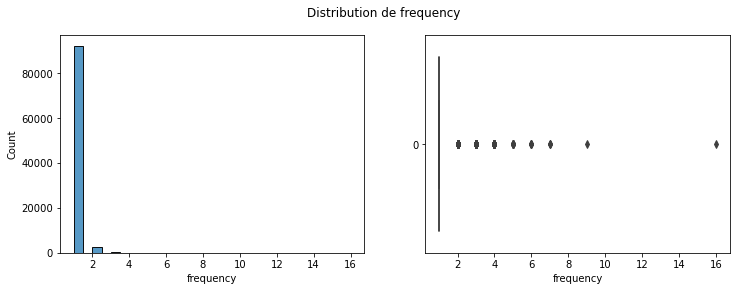

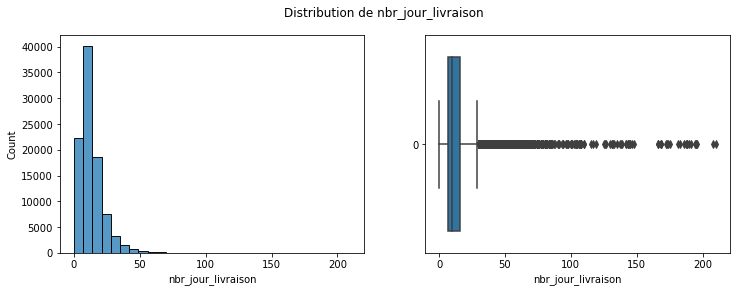

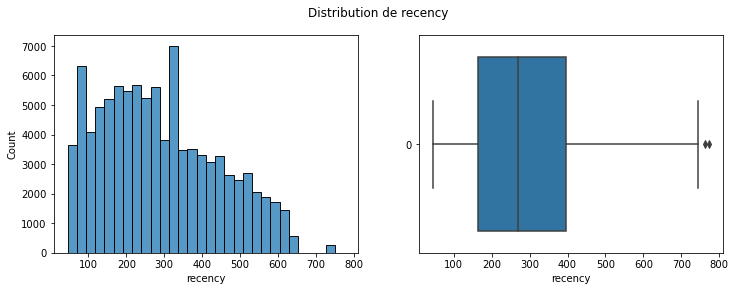

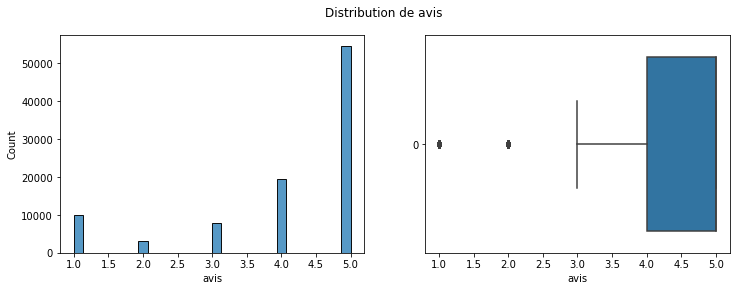

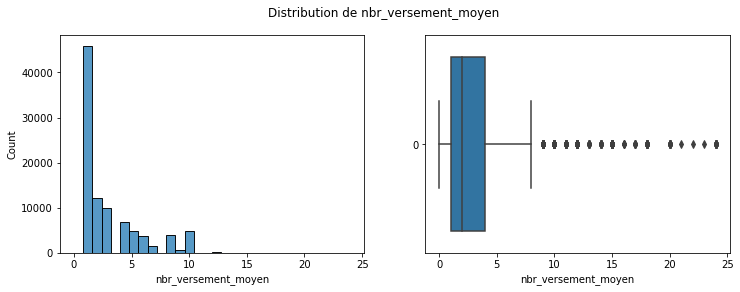

...

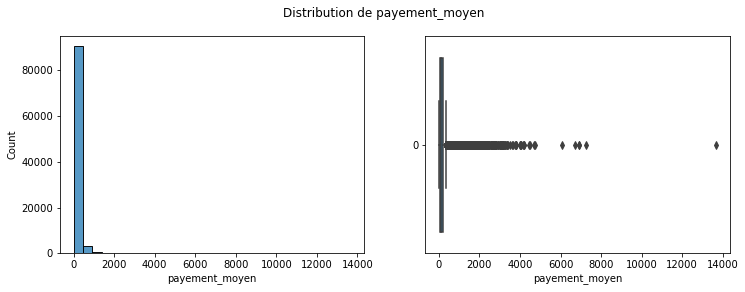

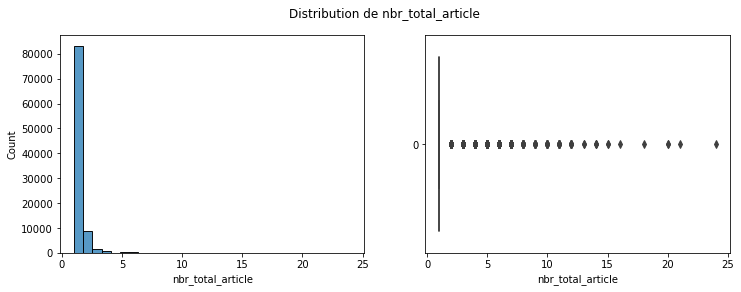

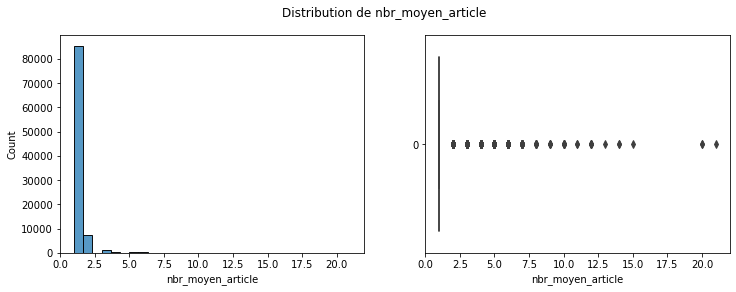

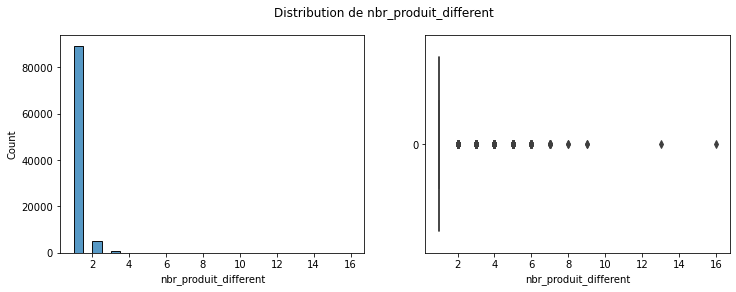

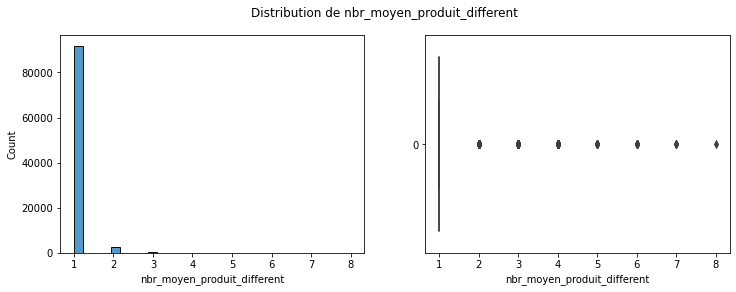

In [186]:
num_columns = list(olist_clients.select_dtypes(
    include=['float', 'int']).columns)
for col in num_columns:
    f, axes = plt.subplots(1, 2, figsize=(12, 4))
    plt.suptitle("Distribution de {}".format(col))
    sns.histplot(data=olist_clients[col], bins=30, ax=axes[0])
    plt.suptitle("Distribution de {}".format(col))
    box_plot = sns.boxplot(data=olist_clients[col], ax=axes[1], orient="h")
    box_plot.set(xlabel=col)
    plt.show()

In [187]:
olist_clients.loc[olist_clients['payement_moyen'] > 5000, :]

,customer_unique_id,localisation,frequency,date_commande,nbr_jour_livraison,recency,avis,nbr_versement_moyen,monetory,payement_moyen,nbr_total_article,nbr_moyen_article,nbr_produit_different,nbr_moyen_produit_different,categorie_produit
3788,0a0a92112bd4c708ca5fde585afaa872,RJ,1,2017-09-29 15:24:52,18,384,1,1,13664.08,13664.08,8,8,1,1,fixed_telephony
23841,4007669dec559734d6f53e029e360987,MG,1,2017-11-24 11:03:35,19,328,1,1,6081.54,6081.54,6,6,1,1,agro_industry_and_commerce
25901,459bef486812aa25204be022145caa62,ES,1,2018-07-25 18:10:17,21,85,4,1,6922.21,6922.21,1,1,1,1,computers
43938,763c8b1c9c68a0229c42c9fc6f662b93,ES,1,2018-07-15 14:49:44,11,95,1,1,7274.88,7274.88,4,4,1,1,fixed_telephony
81850,dc4802a71eae9be1dd28f5d788ceb526,MS,1,2017-02-12 20:37:36,19,613,5,8,6929.31,6929.31,1,1,1,1,housewares
94696,ff4159b92c40ebe40454e3e6a7c35ed6,SP,1,2017-05-24 18:14:34,12,512,5,1,6726.66,6726.66,1,1,1,1,art


In [188]:
olist_clients.loc[olist_clients['monetory'] > 5000, :]

,customer_unique_id,localisation,frequency,date_commande,nbr_jour_livraison,recency,avis,nbr_versement_moyen,monetory,payement_moyen,nbr_total_article,nbr_moyen_article,nbr_produit_different,nbr_moyen_produit_different,categorie_produit
3788,0a0a92112bd4c708ca5fde585afaa872,RJ,1,2017-09-29 15:24:52,18,384,1,1,13664.08,13664.080,8,8,1,1,fixed_telephony
23841,4007669dec559734d6f53e029e360987,MG,1,2017-11-24 11:03:35,19,328,1,1,6081.54,6081.540,6,6,1,1,agro_industry_and_commerce
25901,459bef486812aa25204be022145caa62,ES,1,2018-07-25 18:10:17,21,85,4,1,6922.21,6922.210,1,1,1,1,computers
43938,763c8b1c9c68a0229c42c9fc6f662b93,ES,1,2018-07-15 14:49:44,11,95,1,1,7274.88,7274.880,4,4,1,1,fixed_telephony
81011,da122df9eeddfedc1dc1f5349a1a690c,RJ,2,2017-04-01 15:58:41,16,565,5,10,7571.63,3785.815,2,1,2,1,small_appliances
81850,dc4802a71eae9be1dd28f5d788ceb526,MS,1,2017-02-12 20:37:36,19,613,5,8,6929.31,6929.310,1,1,1,1,housewares
94696,ff4159b92c40ebe40454e3e6a7c35ed6,SP,1,2017-05-24 18:14:34,12,512,5,1,6726.66,6726.660,1,1,1,1,art


In [189]:
df = data_orders_agg.copy()
df.loc[df['customer_unique_id'] == '0a0a92112bd4c708ca5fde585afaa872', :]

,customer_id,customer_unique_id,customer_state,order_id,order_status,order_purchase_timestamp,order_delivery_time_days,oreder_recency_days,review_score,payment_installments,payment_value,order_item_number,order_product_number,product_category_name_english
6195,1617b1357756262bfa56ab541c47bc16,0a0a92112bd4c708ca5fde585afaa872,RJ,03caa2c082116e1d31e67e9ae3700499,delivered,2017-09-29 15:24:52,18,384,1.0,1.0,13664.08,8.0,1.0,fixed_telephony


In [190]:
df = olist_order_items.copy()
df.loc[df['order_id'] == '03caa2c082116e1d31e67e9ae3700499', :]

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
1647,03caa2c082116e1d31e67e9ae3700499,1,5769ef0a239114ac3a854af00df129e4,b37c4c02bda3161a7546a4e6d222d5b2,2017-10-06 15:28:20,1680.0,28.01
1648,03caa2c082116e1d31e67e9ae3700499,2,5769ef0a239114ac3a854af00df129e4,b37c4c02bda3161a7546a4e6d222d5b2,2017-10-06 15:28:20,1680.0,28.01
1649,03caa2c082116e1d31e67e9ae3700499,3,5769ef0a239114ac3a854af00df129e4,b37c4c02bda3161a7546a4e6d222d5b2,2017-10-06 15:28:20,1680.0,28.01
1650,03caa2c082116e1d31e67e9ae3700499,4,5769ef0a239114ac3a854af00df129e4,b37c4c02bda3161a7546a4e6d222d5b2,2017-10-06 15:28:20,1680.0,28.01
1651,03caa2c082116e1d31e67e9ae3700499,5,5769ef0a239114ac3a854af00df129e4,b37c4c02bda3161a7546a4e6d222d5b2,2017-10-06 15:28:20,1680.0,28.01
1652,03caa2c082116e1d31e67e9ae3700499,6,5769ef0a239114ac3a854af00df129e4,b37c4c02bda3161a7546a4e6d222d5b2,2017-10-06 15:28:20,1680.0,28.01
1653,03caa2c082116e1d31e67e9ae3700499,7,5769ef0a239114ac3a854af00df129e4,b37c4c02bda3161a7546a4e6d222d5b2,2017-10-06 15:28:20,1680.0,28.01
1654,03caa2c082116e1d31e67e9ae3700499,8,5769ef0a239114ac3a854af00df129e4,b37c4c02bda3161a7546a4e6d222d5b2,2017-10-06 15:28:20,1680.0,28.01


In [191]:
df = olist_products.copy()
df.loc[df['product_id'] == '5769ef0a239114ac3a854af00df129e4', :]

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
25620,5769ef0a239114ac3a854af00df129e4,telefonia_fixa,39.0,2493.0,3.0,750.0,16.0,16.0,16.0


In [192]:
# fig = px.scatter_3d(olist_clients, x='recency', y='frequency', z='monetory')
# fig.show()

## Variables qualitatives

In [193]:
olist_clients.describe(include='O')

,customer_unique_id,localisation,categorie_produit
count,94983,94983,94983
unique,94983,27,72
top,0000366f3b9a7992bf8c76cfdf3221e2,SP,bed_bath_table
freq,1,39740,8857


### categorie_produit

Dans la suite, les subcatégories seront regroupées sous une catégorie commune en se basant sur les catégories du site amzon.co.uk. Les catégories seront ainsi réduites de 71 sous catégories à 12 grandes catégories que nous considérons pour la segmentation.

In [194]:
olist_clients['categorie_produit'].nunique()

72

In [195]:
# Define dictionnary containing a map between
# the names of different categories and the new categories
categories = list(olist_clients['categorie_produit'].unique())

fashion_word = ['fashion', 'clothes', 'underwear', 'clothing', 'baby']
fashion = [x for x in categories
           if any(word in x for word in fashion_word)]

home_furniture_Garden_word = ['house', 'office_furniture', 'upholstery',
                              'home', 'cuisine', 'cool_stuff', 'room',
                              'mattress', 'tool', 'kitchen', 'table',
                              'bed', 'air_conditioning',
                              'appliance', 'auto']
home_furniture_Garden = [x for x in categories
                         if any(word in x for word
                                in home_furniture_Garden_word)]

book_word = ['book']
book = [x for x in categories
        if any(word in x for word in book_word)]

accessories_decor_word = ['luggage', 'bags', 'supplies',
                          'flowers', 'gift', 'decor']
accessories_decor = [x for x in categories
                     if any(word in x for word
                            in accessories_decor_word)]

electronics_word = ['stationery', 'telephony', 'image',
                    'print', 'audio', 'photo', 'fixed_telephony',
                    'computer', 'electronic']
electronics = [x for x in categories
               if any(word in x for word in electronics_word)]

toys_games_word = ['game', 'consoles_games', 'toy']
toys_games = [x for x in categories
              if any(word in x for word in toys_games_word)]

health_beauty_word = ['hygiene', 'health', 'beauty',
                      'perfumery', 'sport']
health_beauty = [x for x in categories
                 if any(word in x for word in health_beauty_word)]

services_word = ['services', 'security']
services = [x for x in categories
            if any(word in x for word in services_word)]

music_arts_word = ['art', 'dvds', 'musical_instruments', 'music']
music_arts = [x for x in categories
              if any(word in x for word in music_arts_word)]

marketplace_word = ['market', 'place']
marketplace = [x for x in categories
               if any(word in x for word in marketplace_word)]

industry_word = ['agro_industry_and_commerce', 'industry',
                 'commerce', 'business']
industry = [x for x in categories
            if any(word in x for word in industry_word)]

food_drink_word = ['food_drink', 'pet', 'food', 'drink']
food_drink = [x for x in categories
              if any(word in x for word in food_drink_word)]

# dictionnaire
dict_category = {k: "Fashion" for k in fashion}
dict_category.update({k: "Home_FurnitureAndGarden"
                      for k in home_furniture_Garden})
dict_category.update({k: "Books" for k in book})
dict_category.update({k: "AccessoriesAndDecor" for k in accessories_decor})
dict_category.update({k: "Electronics" for k in electronics})
dict_category.update({k: "ToysAndGames" for k in toys_games})
dict_category.update({k: "HealthAndBeauty" for k in health_beauty})
dict_category.update({k: "Services" for k in services})
dict_category.update({k: "MusicAndArts" for k in music_arts})
dict_category.update({k: "MarketPlace" for k in marketplace})
dict_category.update({k: "Industry" for k in industry})
dict_category.update({k: "FoodAndDrink" for k in food_drink})
dict_category.update({'unknown': 'unknown'})

In [196]:
olist_clients['categorie_produit'].nunique()

72

In [197]:
olist_clients['categorie_produit'] = olist_clients['categorie_produit']\
    .map(dict_category)

In [198]:
olist_clients['categorie_produit'].nunique()

13

In [199]:
df_categorie_produit = pd.DataFrame(olist_clients['categorie_produit']
                                    .value_counts())
df_categorie_produit

,categorie_produit
Home_FurnitureAndGarden,31174
HealthAndBeauty,18917
Electronics,16078
AccessoriesAndDecor,14330
ToysAndGames,4750
Fashion,3243
FoodAndDrink,2579
unknown,1346
MusicAndArts,956
Books,795


In [200]:
fig = px.pie(df_categorie_produit,
             values='categorie_produit',
             names=df_categorie_produit.index)
fig.show()

### localisation

In [201]:
df_localisation = pd.DataFrame(olist_clients['localisation']
                               .value_counts().reset_index())
df_localisation.rename(columns={'index': 'Etats de Brésil',
                                'localisation': 'count'}, inplace=True)

In [202]:
df_localisation

,Etats de Brésil,count
0,SP,39740
1,RJ,12235
2,MG,11130
3,RS,5233
4,PR,4824
5,SC,3496
6,BA,3243
7,DF,2056
8,ES,1949
9,GO,1932


In [212]:
fig = px.bar(df_localisation,
             y='count',
             x='Etats de Brésil')
fig.update_layout({
    'plot_bgcolor': 'rgba(0, 0, 0, 0)',
    'paper_bgcolor': 'rgba(0, 0, 0, 0)',
    })
fig.show()

In [204]:
# Brazil coordinates / shape
with urlopen("https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson") as response:
    brazil = json.load(response)

# Since the database doesn't have an ID or feature using which values will be mapped
# between the coordinate/shape database and soybean database,
# we are adding an ID ourselves.
for feature in brazil["features"]:
    feature["id"] = feature["properties"]['sigla']

figure = px.choropleth(
    df_localisation,  # soybean database
    locations='Etats de Brésil',  # define the limits on the map/geography
    geojson=brazil,  # shape information
    color="count",  # defining the color of the scale via database
    hover_name='Etats de Brésil',  # details to show on hover
    title="Nombre de clients par région"  # title of the map
)
figure.update_geos(fitbounds="locations", visible=False)
figure.show()

2:80: E501 line too long (134 > 79 characters)
5:80: E501 line too long (84 > 79 characters)


# Enregistrement des données

In [205]:
# Données clients de Olist
olist_clients.to_csv('olist_clients.csv', index=False)

In [206]:
# Données commandes avec 7 variables
features7_order = ["customer_unique_id",
                   "order_id",
                   "payment_value",
                   "review_score",
                   "order_delivery_time_days",
                   "payment_installments",
                   "order_item_number",
                   "order_purchase_timestamp"]
data_order_features7 = data_orders_agg_red.loc[:, features7_order]
data_order_features7['order_purchase_timestamp'] = data_order_features7[
    'order_purchase_timestamp'].dt.date
data_order_features7.to_csv('olist_orders_features7.csv', index=False)

In [207]:
data_order_features7.head()

,customer_unique_id,order_id,payment_value,review_score,order_delivery_time_days,payment_installments,order_item_number,order_purchase_timestamp
0,861eff4711a542e4b93843c6dd7febb0,00e7ee1b050b8499577073aeb2a297a1,146.87,4.0,9,2.0,1.0,2017-05-16
1,290c77bc529b7ac935b93aa66c333dc3,29150127e6685892b6eab3eec79f59c7,335.48,5.0,17,8.0,1.0,2018-01-12
2,060e732b5b29e8181a18229c7b0b2b5e,b2059ed67ce144a36e2aa97d2c9e9ad2,157.73,5.0,26,7.0,1.0,2018-05-19
3,259dac757896d24d7702b9acbbff3f3c,951670f92359f4fe4a63112aa7306eba,173.30,5.0,15,1.0,1.0,2018-03-13
4,345ecd01c38d18a9036ed96c73b8d066,6b7d50bd145f6fc7f33cebabd7e49d0f,252.25,5.0,11,8.0,1.0,2018-07-29


In [208]:
# # Données clients avec 7 variables
# df = data_order_features7.copy()
# data_customers_features7 = df.groupby('customer_unique_id').agg(
#     # nbre de jours depuis la dernière commande
#     recency=("order_recency_days", 'min'),
#     # nombre de commandes par client
#     frequency=("order_id", 'count'),
#     # somme des payements
#     monetory=("payment_value", 'sum'),
#     # moyenne des scores donnés par le client
#     avis=("review_score", lambda x: round(x.mean())),
#     # nbre de jours moyen de livraison
#     nbr_jour_livraison=("order_delivery_time_days", lambda x: round(x.mean())),
#     # moyenne des nombres de versements
#     nbr_versement_moyen=("payment_installments", lambda x: round(x.mean())),
#     # nombre d'articles achetés
#     nbr_total_article=("order_item_number", lambda x: round(x.sum())),
#     # date de la dernière commande
#     date_commande=("order_purchase_timestamp", 'last'))
# data_customers_features7.to_csv('olist_customers_features7.csv', index=True)

13:80: E501 line too long (81 > 79 characters)
